# A Framework to Evaluate Plausibility of Explainable AI in Clinical Gait Analysis

This code accompanies the paper:

> **"Evaluating Plausibility of Explainable AI in Clinical Gait Analysis: A Framework using Sensitivity, Faithfulness, and Cross-Method Coherence"**  


---




## The Evaluation Framework
The framework evaluates XAI outputs across three complementary dimensions:

| Component | What It Tests | Why It Matters |
|-----------|---------------|----------------|
| **Sensitivity** | Whether top-ranked features functionally influence model output | Confirms highlighted features are truly decision-relevant |
| **Faithfulness** | Whether explanations reflect learned representations (vs. spurious patterns) | Ensures attributions depend on training, not just architecture |
| **Coherence** | Whether different XAI methods consistently highlight similar regions | Reduces method-specific bias and identifies misaligned techniques |

---------------

## XAI Methods Evaluated
We assess seven attribution techniques representing complementary explanatory principles:

| Method | Type | Principle |
|--------|------|-----------|
| **Saliency Maps** | Gradient-based | ∂(output)/∂(input) |
| **Input × Gradient** | Gradient-based | Input-weighted gradients |
| **Integrated Gradients (IG)** | Reference-based | Path-integrated gradients from baseline |
| **GradientSHAP** | Reference-based | Stochastic approximation of Shapley values |
| **Guided Backpropagation (GBP)** | Gradient-based | Modified backward pass (positive only) |
| **DeepLIFT** | Reference-based | Activation comparison to baseline |
| **Layer-wise Relevance Propagation (LRP)** | Propagation-based | Relevance redistribution with ε-rule |

## Experimental Context
- **Task**: Binary classification of **Idiopathic Toe Walking (ITW)** vs. **Typically Developing (TD)** gait
- **Data**: Kinematic recordings from 3D clinical gait analysis (8 joint angles × 101 timepoints)
- **Model**: 1D Convolutional Neural Network with 3 convolutional blocks
- **Validation**: 5-fold subject-stratified cross-validation
- **Why this task**: ITW has a clear expected biomechanical signature (sagittal ankle deviations), enabling comparison with traditional statistical methods (Statistical Parametric Mapping)

#### **Pre-Step 1: Data Loading Workflow**

1. **Event extraction and stride segmentation**  
   Each `.c3d` file was parsed using `ezc3d`, and all gait events (e.g., *Foot Strike*) were identified.  
   Consecutive *Foot Strikes* defined complete gait cycles (Right→Right and Left→Left), which were individually extracted.

2. **Kinematic variable selection**  
   Eight joint angle trajectories were extracted for each stride:  
   - **Pelvis:** Sagittal, Frontal, Transverse  
   - **Hip:** Sagittal, Frontal, Transverse  
   - **Knee:** Sagittal  
   - **Ankle:** Sagittal  

3. **Time normalisation**  
   Each stride was resampled to **101 time points (0–100% gait cycle)** to ensure uniform temporal alignment across subjects and trials.

4. **Output format**  
   All processed data were combined and saved as:  gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz

   with the structure:  

```python
X.shape = (N_strides, 8, 101)   # Normalised stride kinematics
y.shape = (N_strides,)          # Class labels
subjects = list of subject IDs
stride_idx = stride sequence per subject

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

=== Processing group: TDN ===


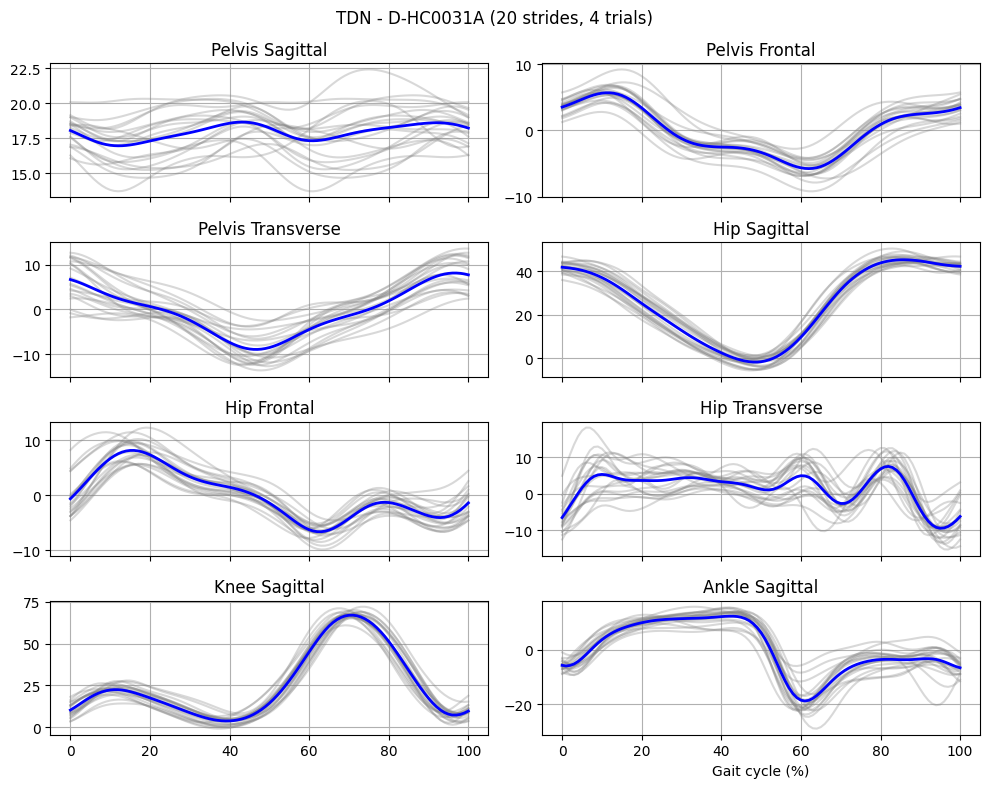

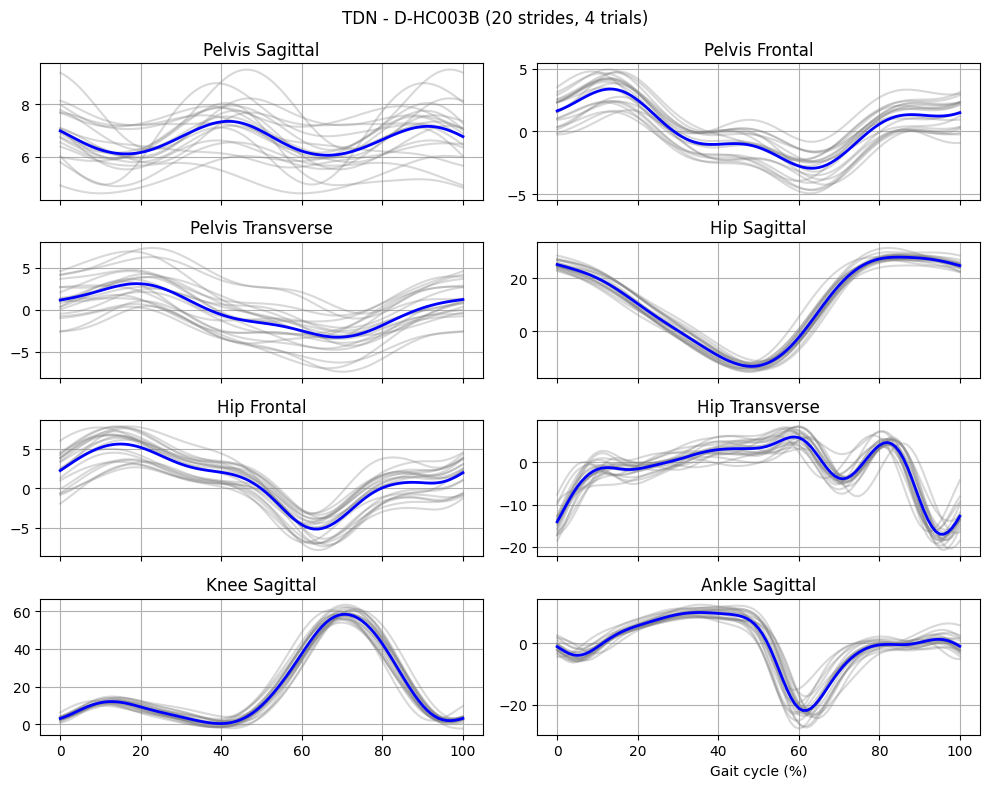

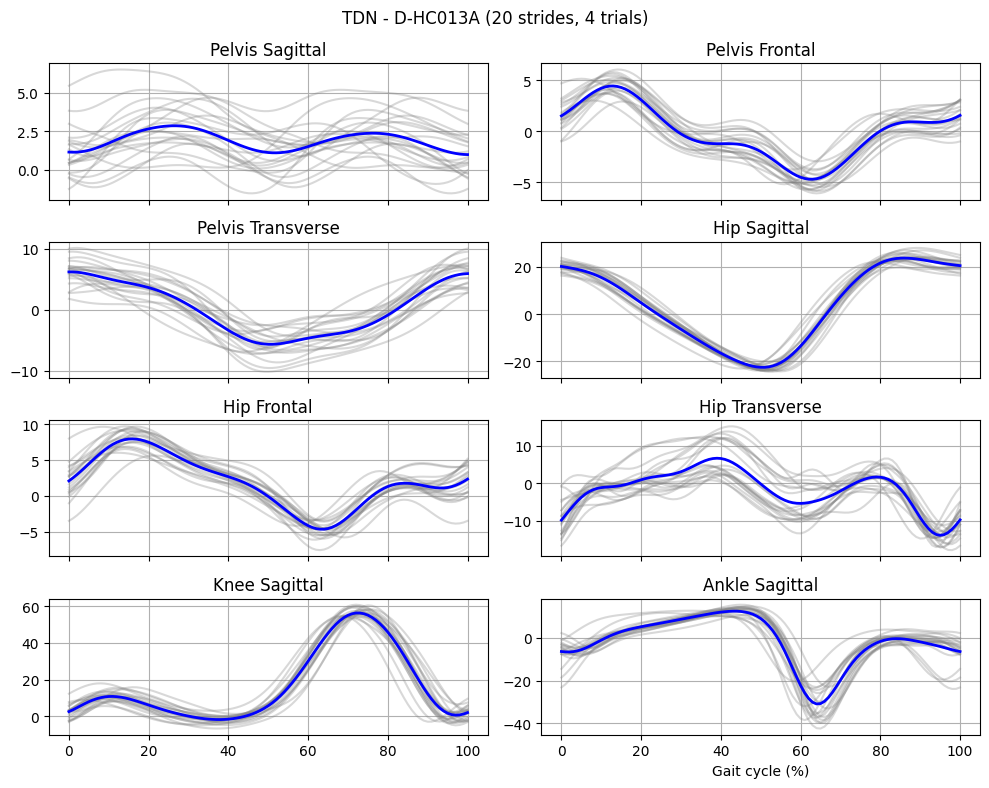

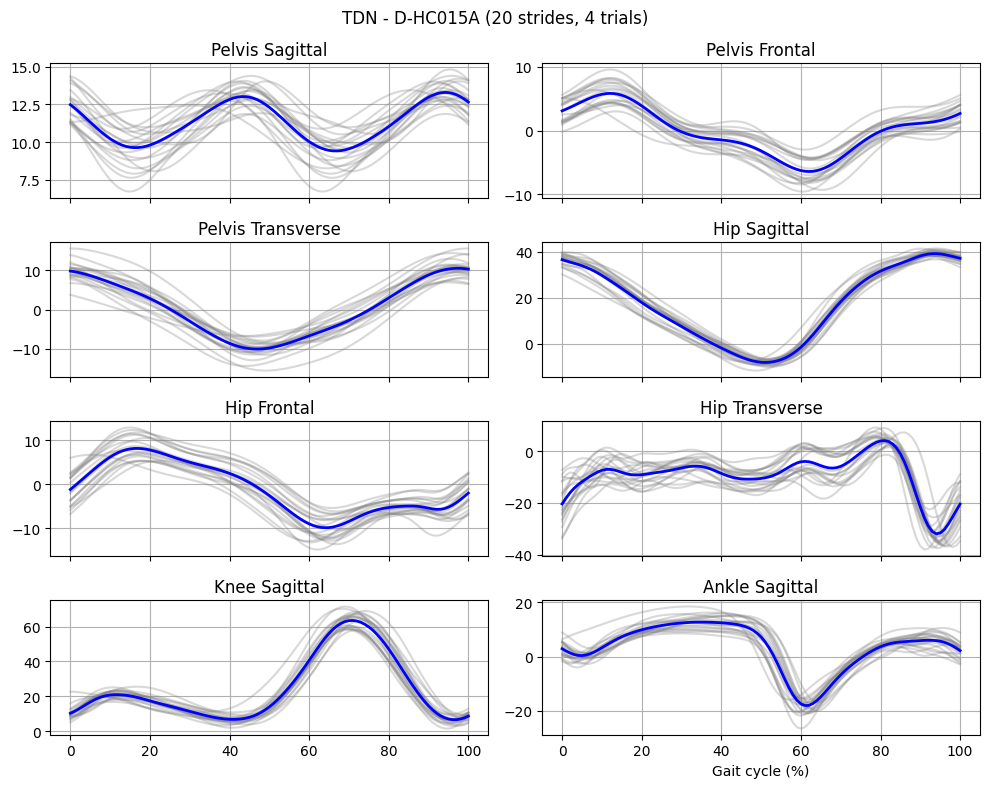

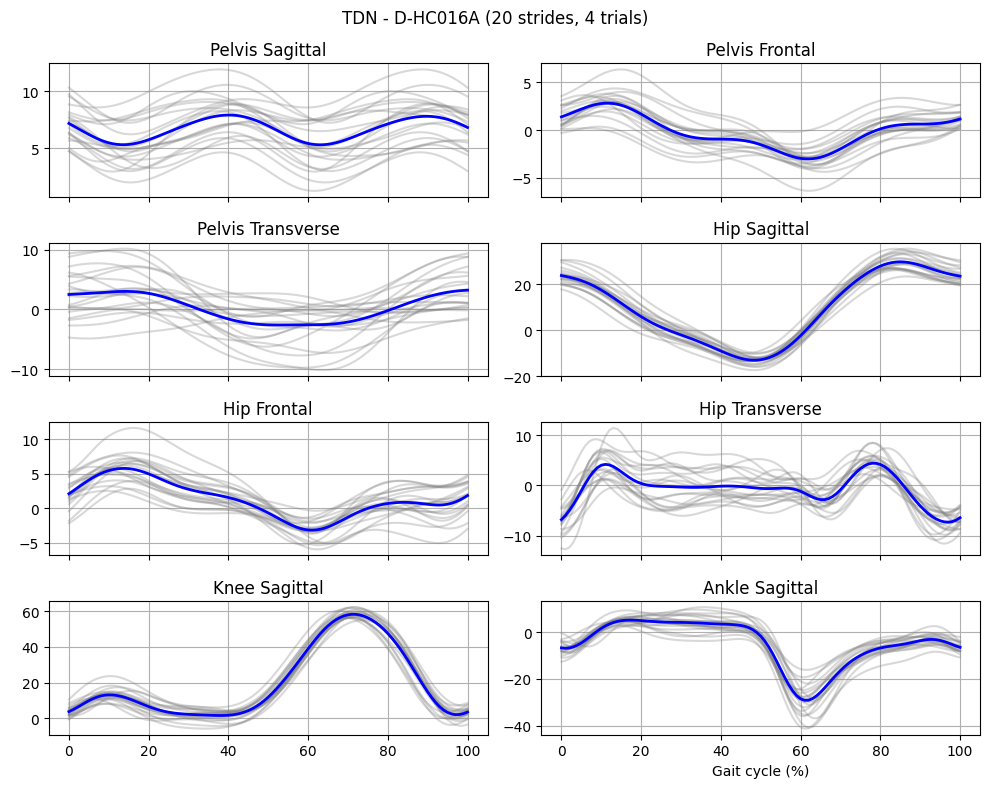

...

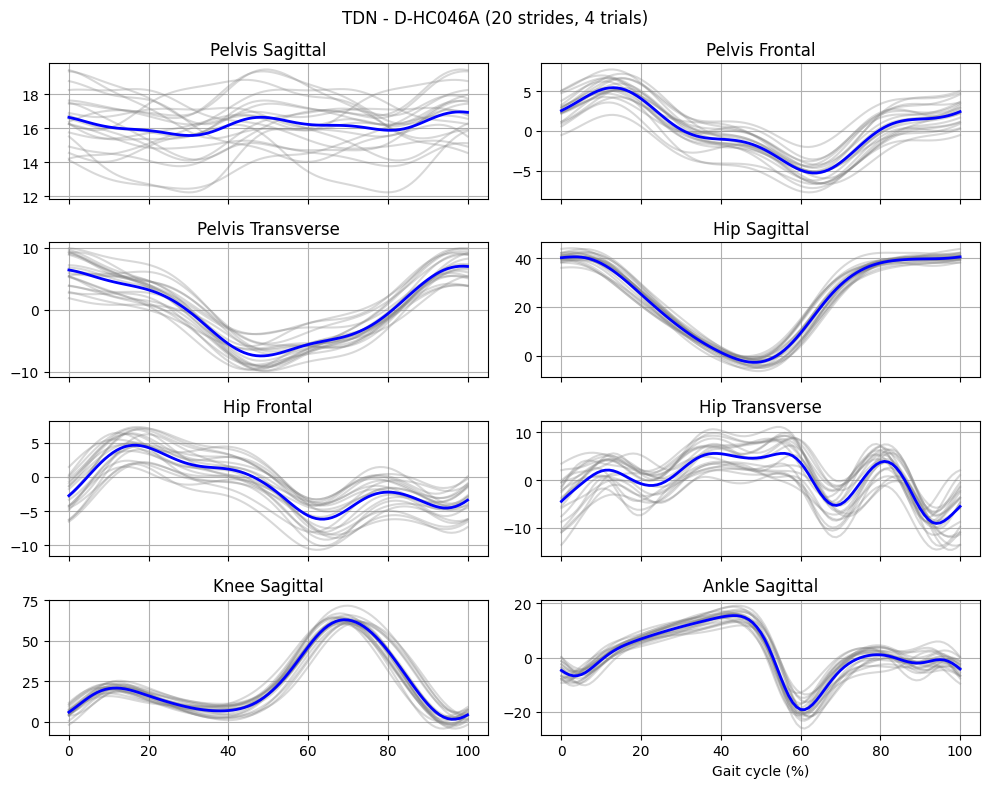

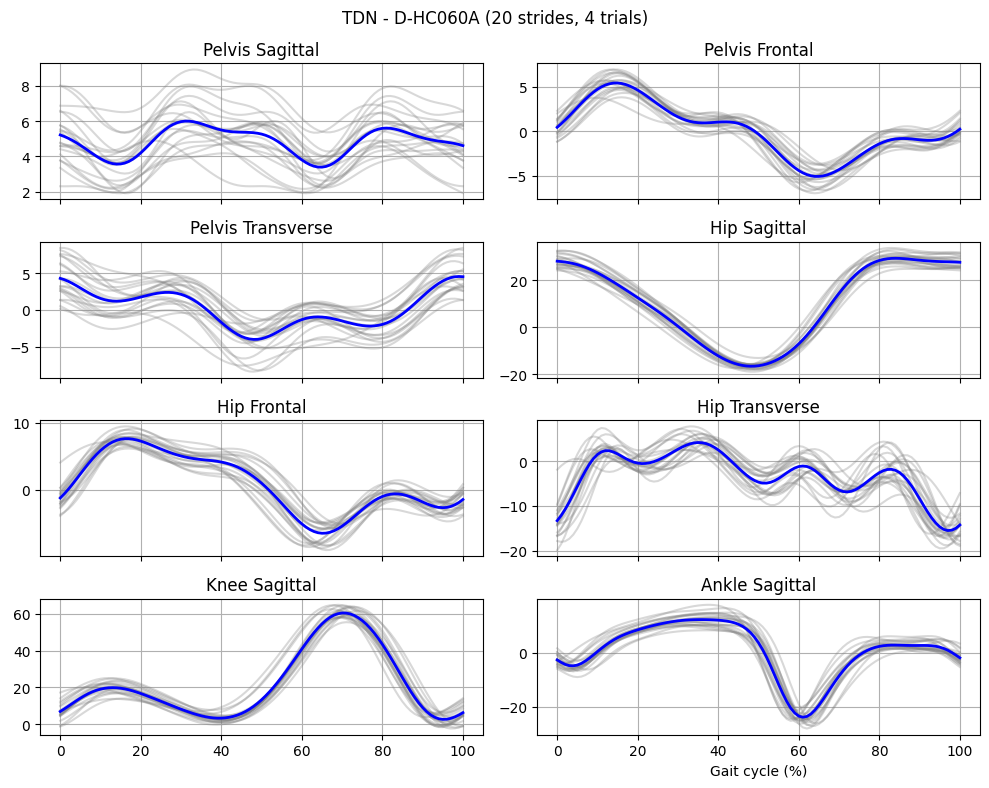

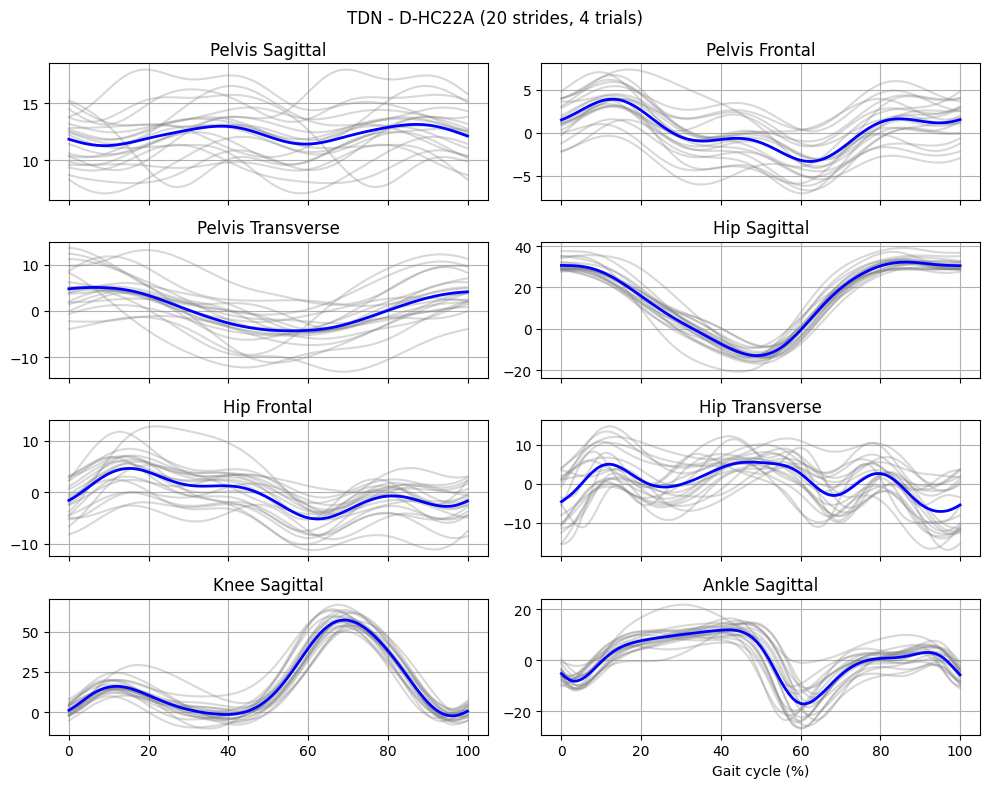

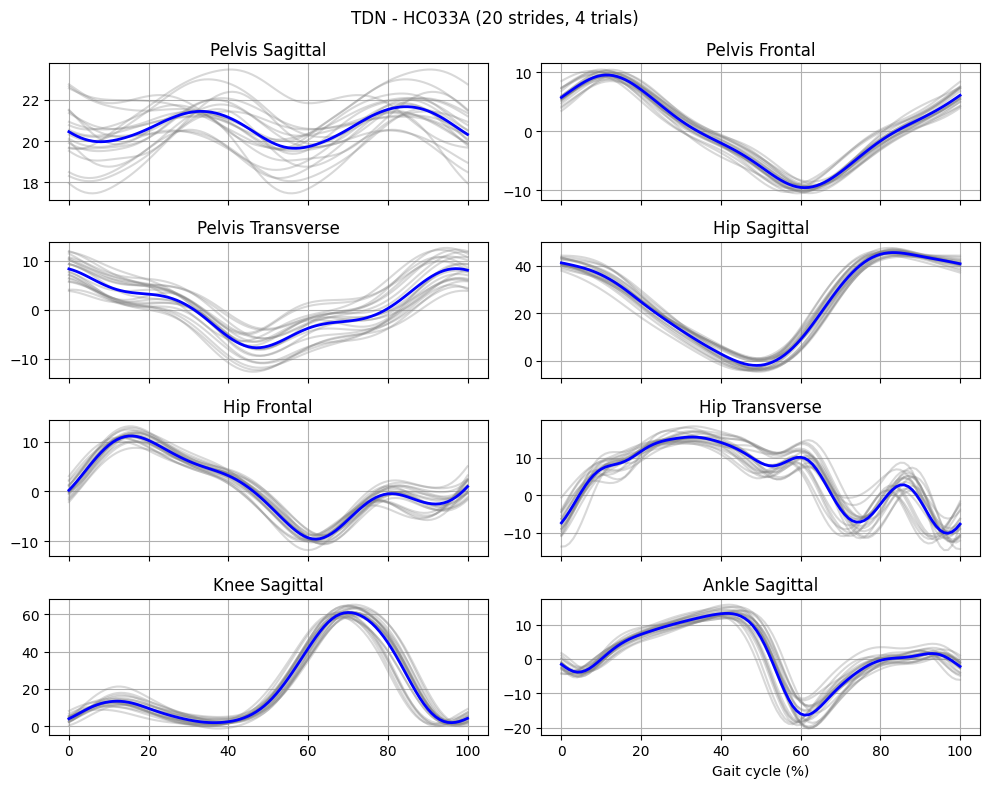

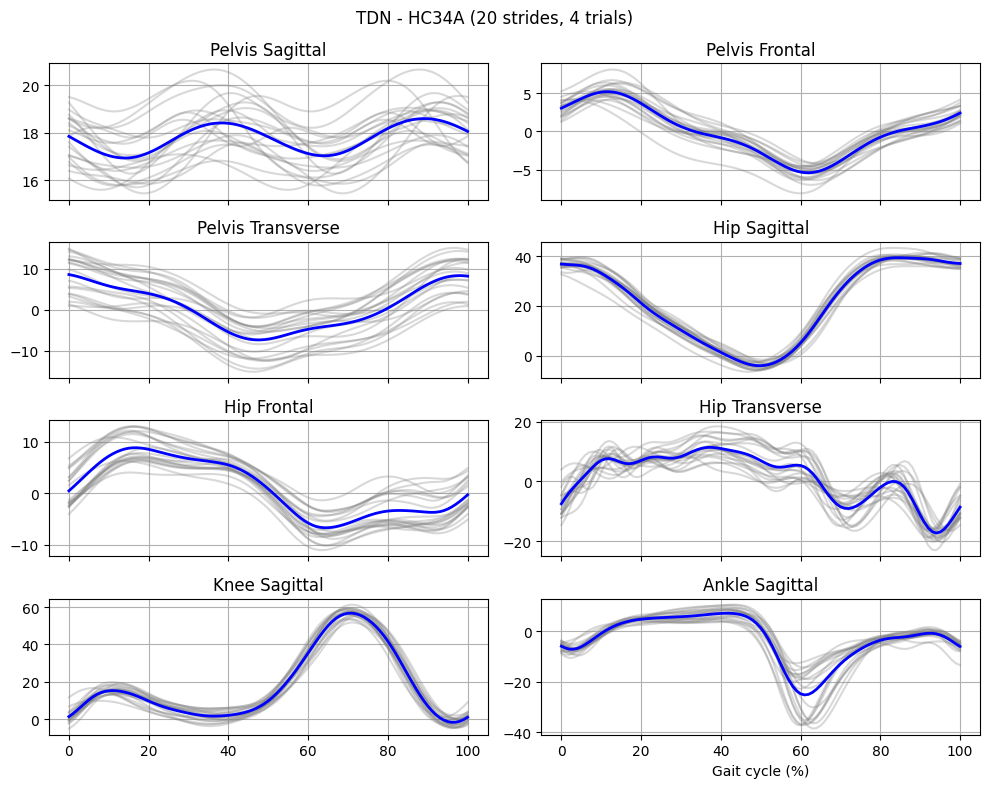


=== Processing group: ITW ===


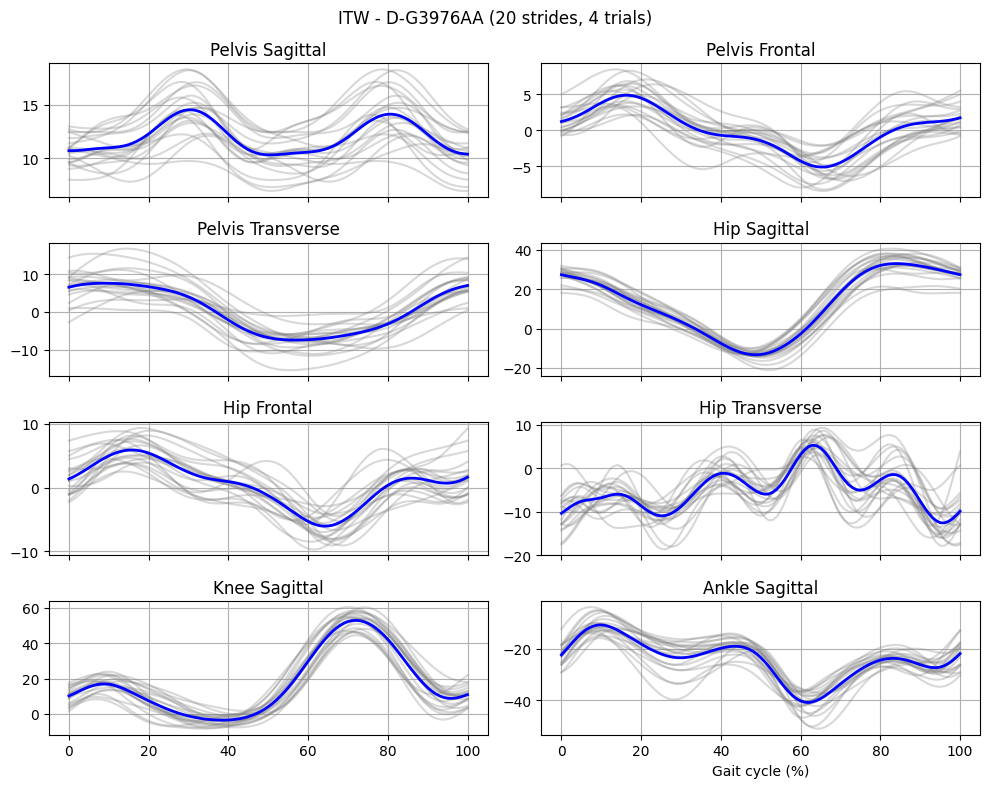

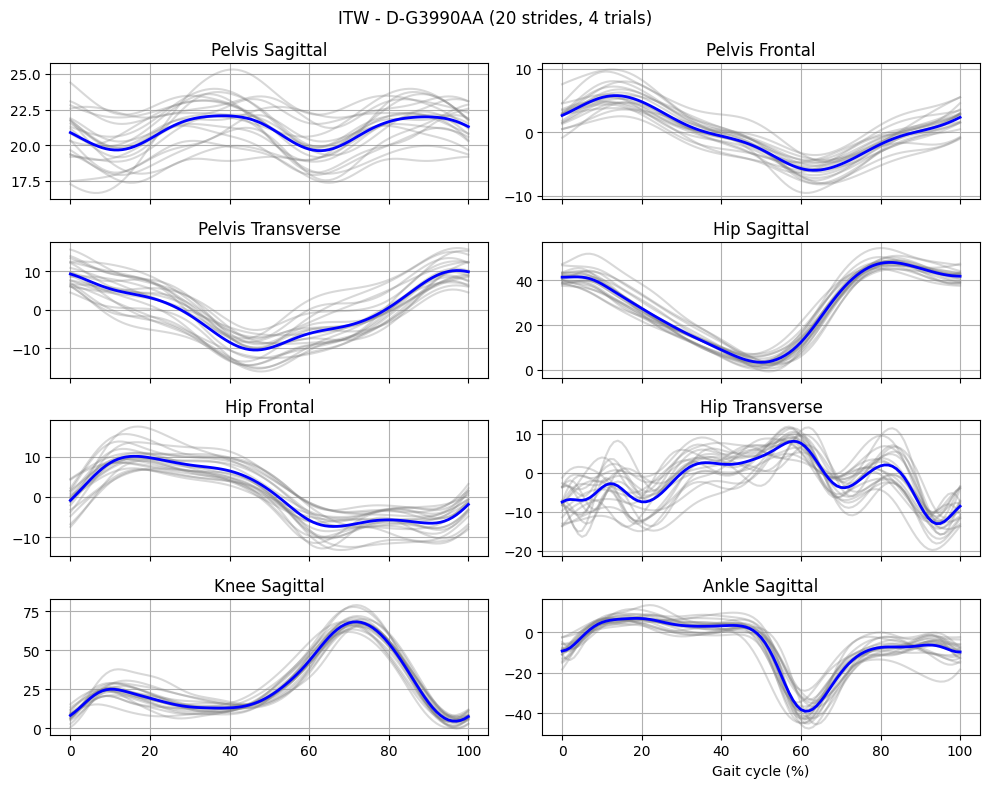

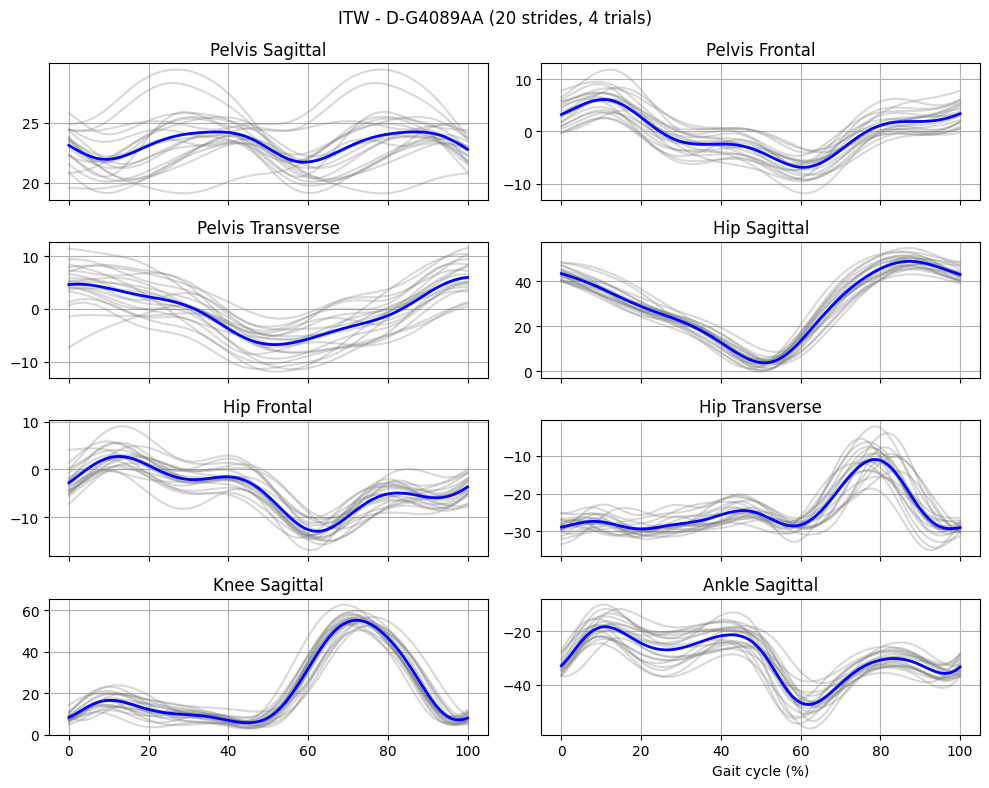

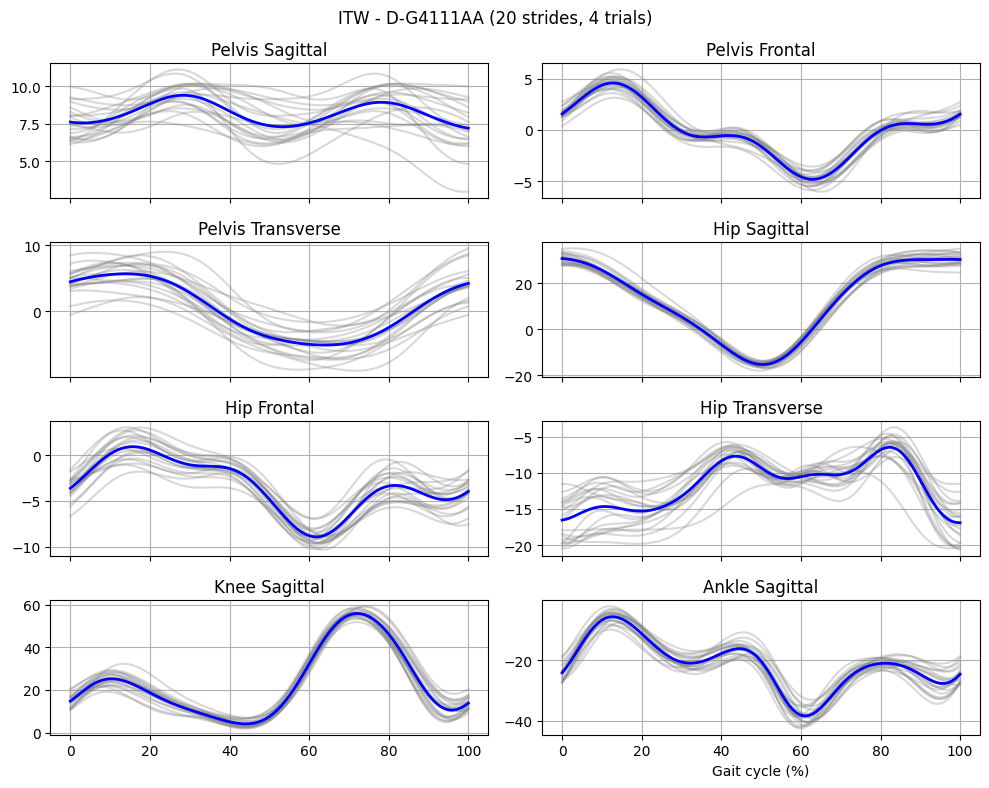

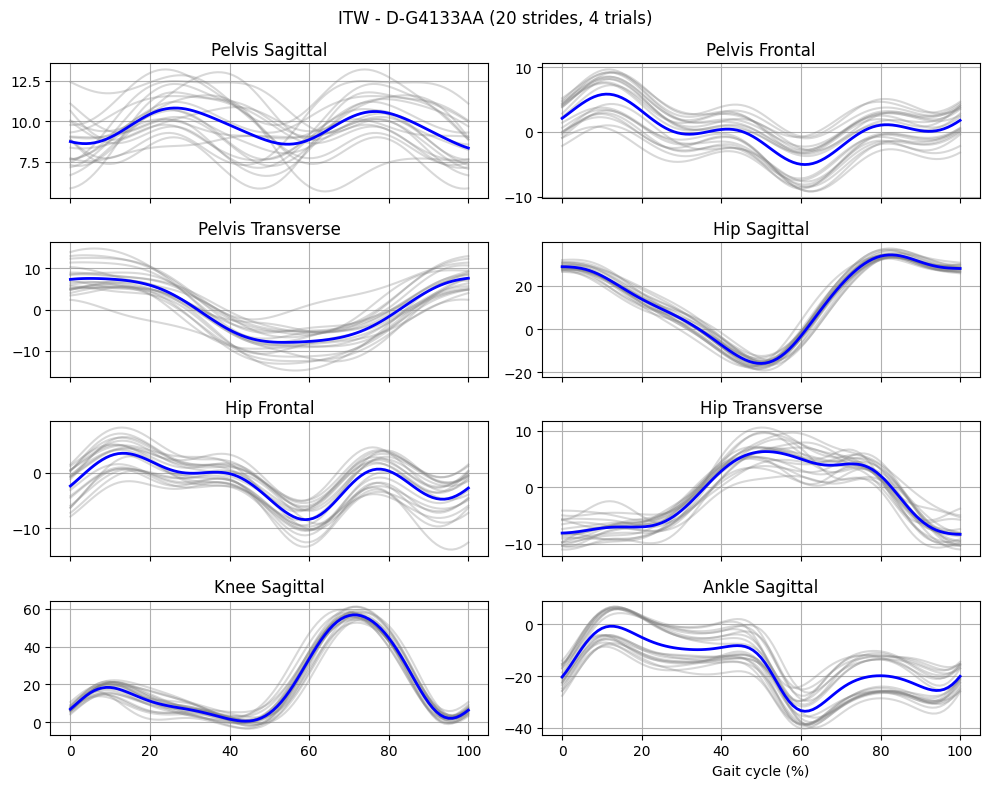

...

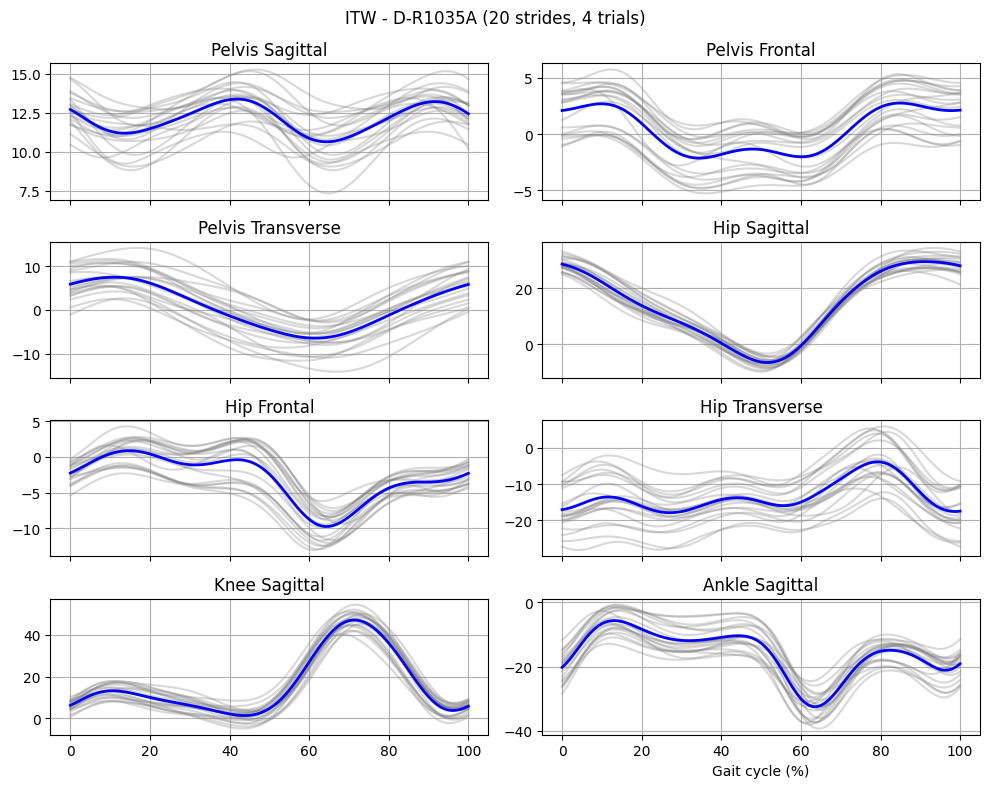

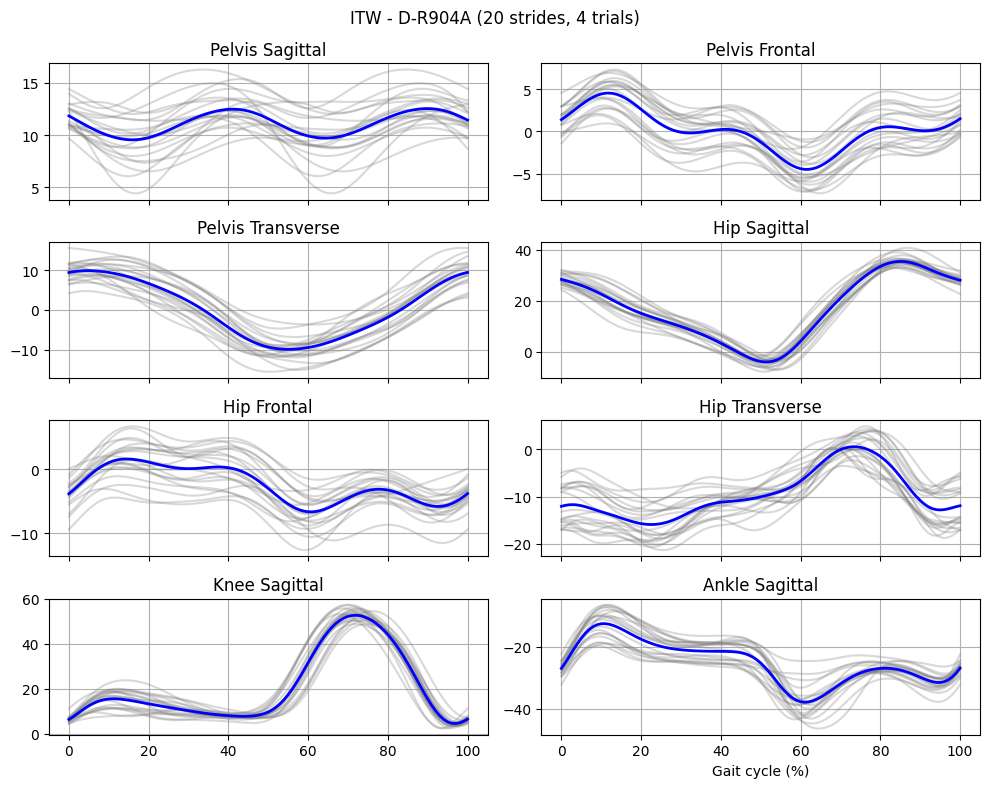

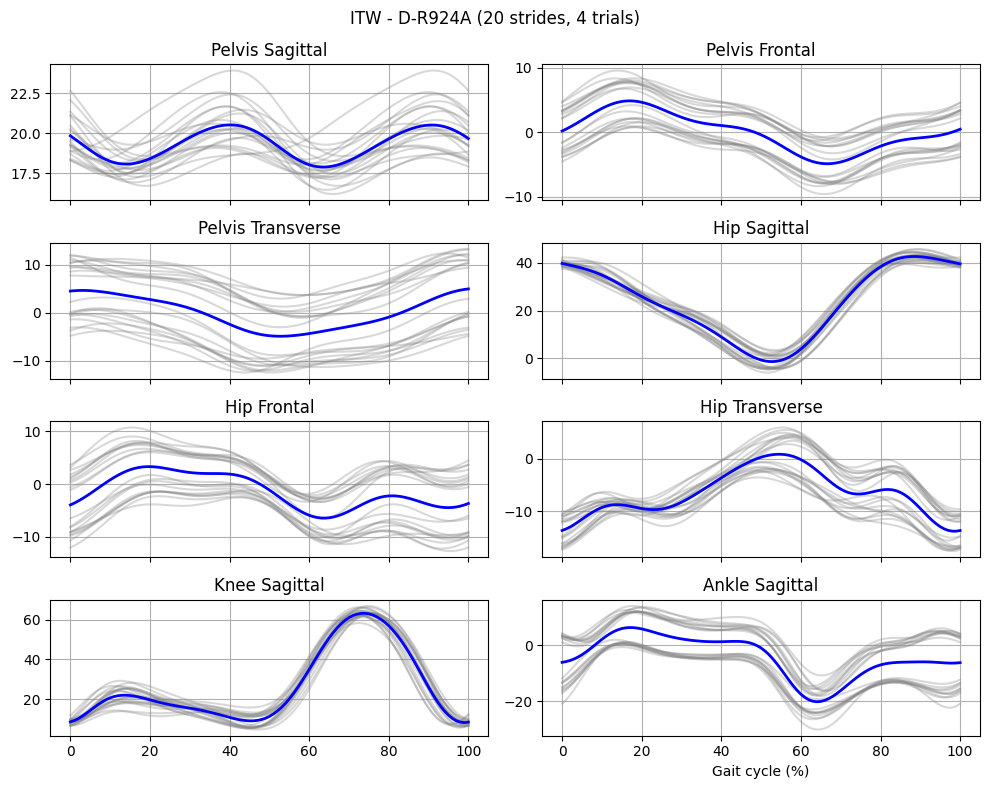

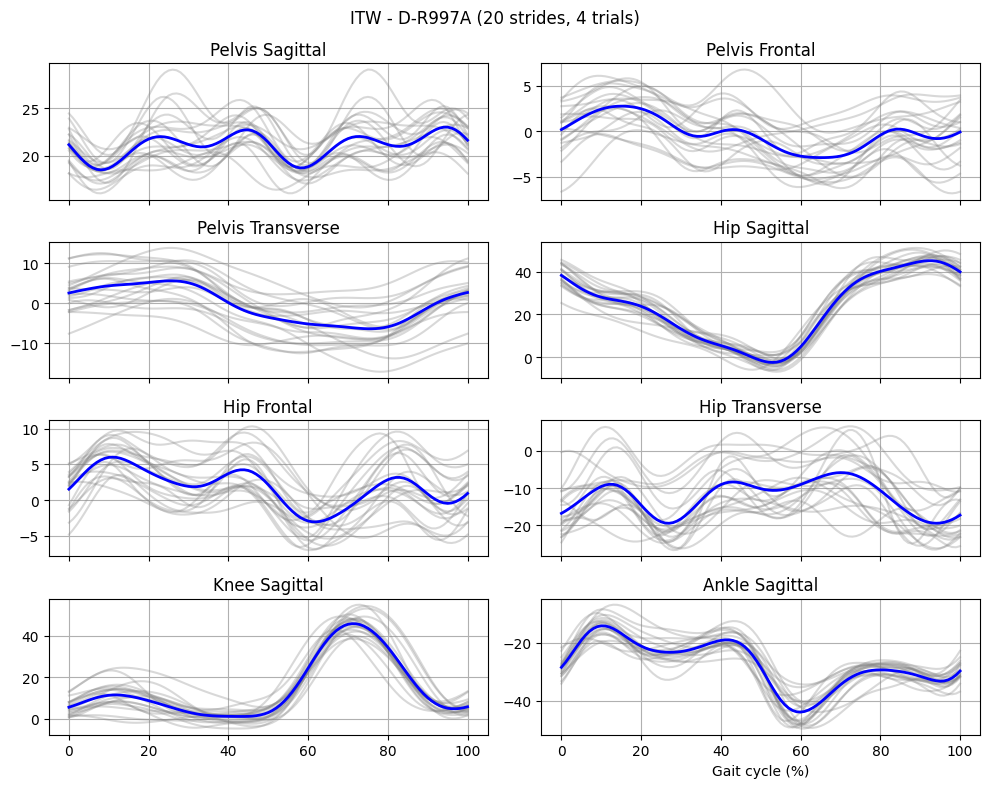

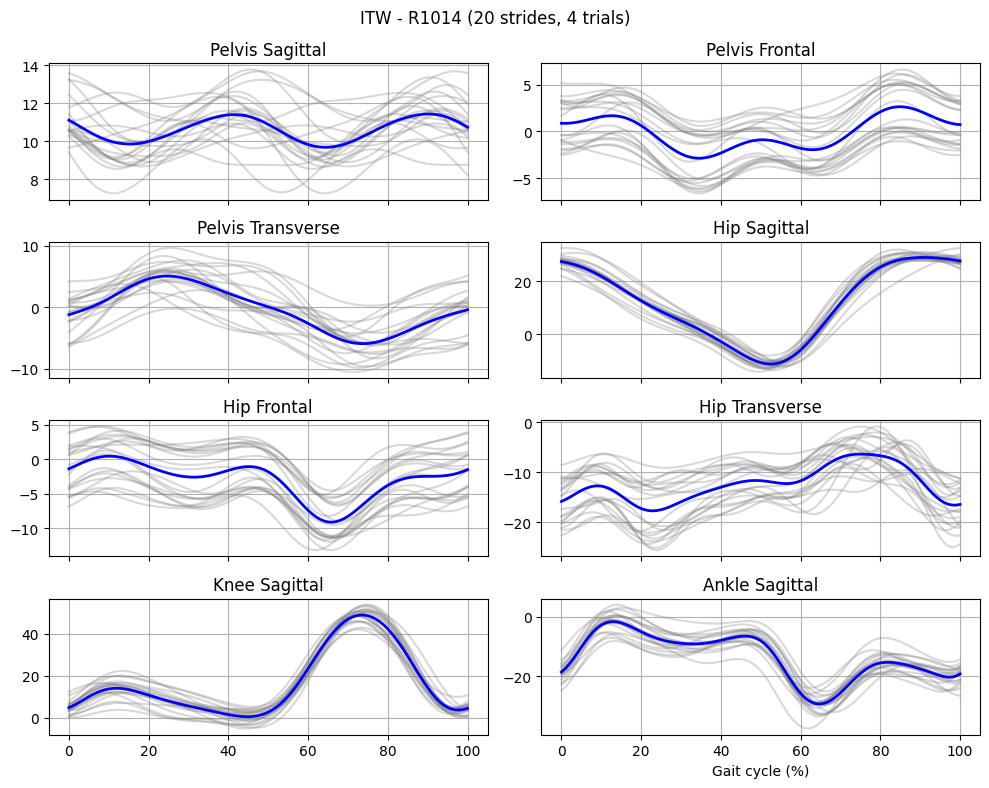


 Dataset built:
   Shape: (720, 8, 101)   Label counts: [360 360]
   Unique subjects: 36

 Saved dataset → /content/drive/MyDrive/XAI_Validation_Study/gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz


In [ ]:
# ==============================
# Dataset Preparation
# ==============================
!pip -q install ezc3d numpy matplotlib
import os, numpy as np, ezc3d, matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive', force_remount=False)

# --- Paths ---
BASE_PATH = "/content/drive/MyDrive/XAI_Validation_Study"
GROUP_DIRS = {
    "TDN": os.path.join(BASE_PATH, "TDN"),
    "ITW": os.path.join(BASE_PATH, "ITW"),
}
CLASS_MAP = {"TDN": 0, "ITW": 1}

# --- Constants ---
PLANE_TO_DIM = {"Sagittal": 0, "Frontal": 1, "Transverse": 2}
CHANNEL_SPECS = [
    ("PelvisAngles", ["Sagittal", "Frontal", "Transverse"]),
    ("HipAngles",    ["Sagittal", "Frontal", "Transverse"]),
    ("KneeAngles",   ["Sagittal"]),
    ("AnkleAngles",  ["Sagittal"]),
]
N_TIME = 101


def get_c3d_files(folder):
    """Return all .c3d files in a folder (non-recursive)."""
    return [os.path.join(folder, f) for f in os.listdir(folder) if f.lower().endswith(".c3d")]


def extract_strides(filepath):
    """Extract all L→L and R→R gait strides from a single C3D file."""
    try:
        c3d = ezc3d.c3d(filepath)
        points = c3d["data"]["points"]
        labels = c3d["parameters"]["POINT"]["LABELS"]["value"]
        fr = c3d["header"]["points"]["frame_rate"]
        time = np.arange(c3d["header"]["points"]["first_frame"],
                         c3d["header"]["points"]["last_frame"] + 1) / fr

        # --- Extract gait events ---
        events = []
        if "EVENT" in c3d["parameters"]:
            evts = c3d["parameters"]["EVENT"]
            lbls = evts.get("LABELS", {}).get("value", [])
            ctxs = evts.get("CONTEXTS", {}).get("value", [])
            times_arr = evts.get("TIMES", {}).get("value", None)
            if len(lbls) and len(ctxs) and times_arr is not None:
                for lab, ctx, ts in zip(lbls, ctxs, times_arr.T):
                    for t in ts:
                        if t > 0:
                            events.append({"Label": lab, "Context": ctx, "Time": float(t)})

        # --- Separate right and left strikes ---
        right_strikes = sorted([e["Time"] for e in events if "Foot Strike" in e["Label"] and "Right" in e["Context"]])
        left_strikes  = sorted([e["Time"] for e in events if "Foot Strike" in e["Label"] and "Left"  in e["Context"]])

        if len(right_strikes) < 2 and len(left_strikes) < 2:
            return None

        cycles = []

        def extract_cycles_for_side(side, strikes):
            prefix = "R" if side == "Right" else "L"
            for i in range(len(strikes) - 1):
                t0, t1 = strikes[i], strikes[i + 1]
                s_idx = int((t0 - time[0]) * fr)
                e_idx = int((t1 - time[0]) * fr)
                if e_idx <= s_idx:
                    continue

                chans = []
                for base, planes in CHANNEL_SPECS:
                    label = f"{prefix}{base}"
                    if label not in labels:
                        return None
                    for plane in planes:
                        dim = PLANE_TO_DIM[plane]
                        curve = points[dim, labels.index(label), s_idx:e_idx + 1]
                        if curve.size < 5 or np.isnan(curve).any():
                            return None
                        norm = np.interp(np.linspace(0, 1, N_TIME),
                                         np.linspace(0, 1, len(curve)), curve)
                        chans.append(norm)
                if len(chans) == 8:
                    cycles.append(np.stack(chans, axis=0))

        if len(right_strikes) >= 2:
            extract_cycles_for_side("Right", right_strikes)
        if len(left_strikes) >= 2:
            extract_cycles_for_side("Left", left_strikes)

        return cycles if len(cycles) else None

    except Exception:
        return None

# --- Dataset containers ---
X_list, y_list, subj_list, files_list, stride_idx_list, skipped = [], [], [], [], [], []

# --- Loop through all subjects ---
for group, folder in GROUP_DIRS.items():
    print(f"\n=== Processing group: {group} ===")
    for subj_folder in sorted(os.listdir(folder)):
        subj_path = os.path.join(folder, subj_folder)
        if not os.path.isdir(subj_path):
            continue

        subj_cycles = []
        c3d_files = get_c3d_files(subj_path)
        if len(c3d_files) == 0:
            print(f" No C3D files for subject {subj_folder}")
            continue

        for f in c3d_files:
            cycles = extract_strides(f)
            if cycles:
                subj_cycles.extend(cycles)

        if not subj_cycles:
            print(f" No valid strides for subject {subj_folder}")
            continue

        subj_cycles = np.array(subj_cycles)
        mean_curve = np.mean(subj_cycles, axis=0)

        # --- Subject-level plot ---
        fig, axs = plt.subplots(4, 2, figsize=(10, 8), sharex=True)
        axs = axs.flatten()
        names = [
            "Pelvis Sagittal", "Pelvis Frontal", "Pelvis Transverse",
            "Hip Sagittal", "Hip Frontal", "Hip Transverse",
            "Knee Sagittal", "Ankle Sagittal"
        ]
        x = np.linspace(0, 100, N_TIME)
        for i, ax in enumerate(axs):
            for stride in subj_cycles:
                ax.plot(x, stride[i], color="gray", alpha=0.3)
            ax.plot(x, mean_curve[i], color="blue", lw=2)
            ax.set_title(names[i])
            ax.grid(True)
        axs[-1].set_xlabel("Gait cycle (%)")
        plt.suptitle(f"{group} - {subj_folder} ({len(subj_cycles)} strides, {len(c3d_files)} trials)")
        plt.tight_layout()
        plt.show()

        # --- Add to dataset with stride index ---
        for i, cyc in enumerate(subj_cycles):
            X_list.append(cyc)
            y_list.append(CLASS_MAP[group])
            subj_list.append(subj_folder)
            files_list.append(subj_path)
            stride_idx_list.append(i + 1)  # 1-based index per subject

# --- Save dataset ---
X = np.stack(X_list, axis=0).astype(np.float32)
y = np.array(y_list, dtype=np.int64)
subjects = np.array(subj_list, dtype=object)
files = np.array(files_list, dtype=object)
stride_idx = np.array(stride_idx_list, dtype=np.int64)

print("\n Dataset built:")
print("   Shape:", X.shape, "  Label counts:", np.bincount(y))
print("   Unique subjects:", len(np.unique(subjects)))

out_path = os.path.join(BASE_PATH, "gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz")
np.savez(out_path, X=X, y=y, subjects=subjects, files=files, stride_idx=stride_idx)
print(f"\n Saved dataset → {out_path}")


#### **Pre-Step 2: Model Definition, Training, and Validation Workflow**


**1. Data Loading and Normalisation**

- The processed gait dataset (`gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz`) was loaded, containing **eight kinematic channels** over **101 normalised gait cycle points**.
- Data were **z-score normalised** using training split statistics to ensure consistency across folds and prevent data leakage.

---

**2. Dataset Structure and Sampling Strategy**

- Each stride (8×101) served as one input sample with shape: `(batch_size, channels=8, timepoints=101)`.
- **Subject-level 5-fold Group K-Fold cross-validation** was applied to prevent data leakage, with approximately **80/20 train-test splits** per fold (28–29 subjects for training, 7–8 subjects for testing).

---

**3. Model Architecture (1D-CNN)**

A 1D Convolutional Neural Network was chosen for its ability to capture local temporal dependencies within each channel:

| Layer | Configuration | Output Shape |
|-------|---------------|--------------|
| Input | - | (batch, 8, 101) |
| Conv1D Block 1 | 32 filters, kernel=7, padding=3 + ReLU + MaxPool (size=2) | (batch, 32, 50) |
| Conv1D Block 2 | 64 filters, kernel=5, padding=2 + ReLU + MaxPool (size=2) | (batch, 64, 25) |
| Conv1D Block 3 | 64 filters, kernel=3, padding=3 + ReLU + MaxPool (size=2) | (batch, 64, 12) |
| Flatten | - | (batch, 768) |
| Output | Fully connected (2 units) | (batch, 2) |

*Note: Kernel sizes and padding were chosen to preserve temporal dimensionality before pooling.*

---

**4. Training Procedure**

- **Optimizer**: Adam with learning rate = 1×10⁻³
- **Loss function**: Cross-entropy loss
- **Batch size**: 256
- **Epochs**: Maximum 100 with **early stopping** (patience = 15)
- **Hardware**: Mixed-precision training used for GPU efficiency (if available)

---

**5. Cross-Validation and Model Saving**

- **Five-fold cross-validation** was performed with subject-level stratification.
- Performance metrics (Accuracy, AUROC) were recorded for each fold.
- The best model from each fold (based on validation loss) was saved for subsequent XAI attribution analysis.

---


In [1]:
# ======================
# Define + Train 1D-CNN
# ======================

import os
import random
import copy
import pickle
import warnings
warnings.filterwarnings('ignore')

# Install required packages
!pip install -q torch scikit-learn numpy matplotlib pandas tqdm

from google.colab import drive, files
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, roc_auc_score
from tqdm import tqdm

# ----------------------------------------------------------------------
# GPU Setup
# ----------------------------------------------------------------------

def setup_gpu():
    """Configure GPU settings if available, otherwise fallback to CPU."""
    if torch.cuda.is_available():
        device = torch.device('cuda')
        print(f"GPU available: {torch.cuda.get_device_name(0)}")
        torch.backends.cudnn.benchmark = True
        torch.backends.cudnn.enabled = True
        torch.cuda.empty_cache()
        return device
    print("GPU not available, using CPU")
    return torch.device('cpu')

DEVICE = setup_gpu()

# ----------------------------------------------------------------------
# Set Random Seed for Reproducibility
# ----------------------------------------------------------------------

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# ----------------------------------------------------------------------
# Data Loading: Choose Method
# ----------------------------------------------------------------------

print("\n" + "="*60)
print("DATA LOADING OPTIONS")
print("="*60)
print("How would you like to load the gait data?")
print("1. Mount Google Drive (use existing file path)")
print("2. Upload .npz file directly")

choice = input("\nEnter choice (1 or 2): ").strip()

if choice == "1":
    # Option 1: Mount Google Drive
    print("\nMounting Google Drive...")
    drive.mount('/content/drive', force_remount=False)

    # Ask for file path
    default_path = "/content/drive/MyDrive/XAI_Validation_Study/gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz"
    print(f"\nDefault path: {default_path}")
    custom_path = input("Press Enter to use default, or paste your custom path: ").strip()

    NPZ_PATH = custom_path if custom_path else default_path

    # Check if file exists
    if not os.path.exists(NPZ_PATH):
        raise FileNotFoundError(f"File not found at: {NPZ_PATH}")

    print(f"File found at: {NPZ_PATH}")

    # Set save path for models
    BASE_PATH = os.path.dirname(NPZ_PATH)
    MODELS_SAVE_PATH = os.path.join(BASE_PATH, "saved_models_1dcnn")

elif choice == "2":
    # Option 2: Upload file directly
    print("\nPlease upload your .npz file...")
    print("(Expected filename: gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz)")

    uploaded = files.upload()

    # Get the uploaded filename
    uploaded_files = list(uploaded.keys())
    if not uploaded_files:
        raise ValueError("No file uploaded")

    NPZ_PATH = uploaded_files[0]
    print(f"File uploaded: {NPZ_PATH}")

    # Set save paths locally
    BASE_PATH = "/content"
    MODELS_SAVE_PATH = "/content/saved_models_1dcnn"

else:
    raise ValueError("Invalid choice. Please enter 1 or 2.")

# Create save directory
os.makedirs(MODELS_SAVE_PATH, exist_ok=True)
print(f"Models will be saved to: {MODELS_SAVE_PATH}")

# ----------------------------------------------------------------------
# Configuration
# ----------------------------------------------------------------------

BATCH_SIZE = 256
LEARNING_RATE = 1e-3
EPOCHS = 100
PATIENCE = 15
K_FOLDS = 5

print(f"\nConfiguration:")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Learning rate: {LEARNING_RATE}")
print(f"  Max epochs: {EPOCHS}")
print(f"  Early stopping patience: {PATIENCE}")
print(f"  Cross-validation folds: {K_FOLDS}")

# ----------------------------------------------------------------------
# Load Data
# ----------------------------------------------------------------------

def load_data():
    """Load the preprocessed gait dataset from .npz file."""
    print(f"\nLoading data from: {NPZ_PATH}")
    data = np.load(NPZ_PATH, allow_pickle=True)
    X, y, subjects = data["X"], data["y"], data["subjects"]
    print(f"  X shape: {X.shape} (strides x channels x timepoints)")
    print(f"  y shape: {y.shape}")
    print(f"  Unique subjects: {len(np.unique(subjects))}")
    print(f"  Label distribution (stride-level): {np.bincount(y)} (TD=0, ITW=1)")
    return X, y, subjects

X, y, subjects = load_data()

# ----------------------------------------------------------------------
# Subject-level Label Aggregation
# ----------------------------------------------------------------------

def make_subject_level_labels(y, subjects):
    unique_subjects = np.unique(subjects)
    y_subject = np.zeros(len(unique_subjects), dtype=int)

    for i, s in enumerate(unique_subjects):
        ys = y[subjects == s]
        # Use majority vote
        y_subject[i] = int(np.round(np.mean(ys)))

    return unique_subjects, y_subject

unique_subjects, y_subject = make_subject_level_labels(y, subjects)
print(f"\nSubject-level label distribution: {np.bincount(y_subject)} (TD=0, ITW=1)")

# ----------------------------------------------------------------------
# Normalisation
# ----------------------------------------------------------------------

def normalize_data(X_train, X_val, X_test):
    """
    Z-score normalize data using training set statistics.

    Parameters
    ----------
    X_train, X_val, X_test : array-like
        Data splits to normalize

    Returns
    -------
    X_train_norm, X_val_norm, X_test_norm : array-like
        Normalised data splits
    """
    mean = X_train.mean(axis=(0, 2), keepdims=True)
    std = X_train.std(axis=(0, 2), keepdims=True) + 1e-8
    norm = lambda arr: (arr - mean) / std
    return norm(X_train), norm(X_val), norm(X_test)

# ----------------------------------------------------------------------
# PyTorch Dataset
# ----------------------------------------------------------------------

class StrideDataset(Dataset):
    """PyTorch Dataset for gait stride data."""

    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# ----------------------------------------------------------------------
# 1D CNN Model Architecture
# ----------------------------------------------------------------------

class CNN1D(nn.Module):
    """
    1D Convolutional Neural Network for gait classification.

    Architecture matches the paper specification:
    - Block 1: Conv1d(8→32, kernel=7) + ReLU + MaxPool
    - Block 2: Conv1d(32→64, kernel=5) + ReLU + MaxPool
    - Block 3: Conv1d(64→64, kernel=3) + ReLU
    - Classifier: Linear(64*25 → 128) + ReLU + Dropout + Linear(128 → 2)
    """

    def __init__(self, input_channels=8, output_dim=2):
        super().__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv1d(input_channels, 32, 7, padding=3),
            nn.ReLU(),
            nn.MaxPool1d(2),

            nn.Conv1d(32, 64, 5, padding=2),
            nn.ReLU(),
            nn.MaxPool1d(2),

            nn.Conv1d(64, 64, 3, padding=1),
            nn.ReLU()
        )

        self.classifier = nn.Sequential(
            nn.Linear(64 * 25, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, output_dim)
        )

    def forward(self, x):
        features = self.conv_layers(x)
        flattened = features.flatten(1)
        return self.classifier(flattened)

    def get_parameter_count(self):
        """Return total number of trainable parameters."""
        return sum(p.numel() for p in self.parameters())

# ----------------------------------------------------------------------
# Training Function
# ----------------------------------------------------------------------

def train_model(model, train_loader, val_loader, class_weights=None,
                lr=LEARNING_RATE, epochs=EPOCHS, patience=PATIENCE):
    """
    Train the model with early stopping based on validation loss.

    Parameters
    ----------
    model : nn.Module
        Model to train
    train_loader, val_loader : DataLoader
        Data loaders for training and validation
    class_weights : torch.Tensor, optional
        Weights for imbalanced classes
    lr : float
        Learning rate
    epochs : int
        Maximum number of epochs
    patience : int
        Early stopping patience

    Returns
    -------
    model : nn.Module
        Trained model with best weights
    train_losses, val_losses : list
        Training and validation loss histories
    best_loss : float
        Best validation loss achieved
    """
    model = model.to(DEVICE)

    # Loss function with optional class weights
    if class_weights is not None:
        class_weights = class_weights.to(DEVICE)
    criterion = nn.CrossEntropyLoss(weight=class_weights)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Mixed precision training for GPU efficiency
    scaler = torch.cuda.amp.GradScaler() if DEVICE.type == 'cuda' else None

    best_loss = float('inf')
    wait = 0
    best_state = None
    train_losses = []
    val_losses = []

    for epoch in tqdm(range(epochs), desc="Training", unit="epoch"):
        # Training phase
        model.train()
        total_loss = 0.0

        for xb, yb in train_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            optimizer.zero_grad()

            if scaler:
                # Mixed precision forward/backward
                with torch.cuda.amp.autocast():
                    loss = criterion(model(xb), yb)
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                # Standard precision
                loss = criterion(model(xb), yb)
                loss.backward()
                optimizer.step()

            total_loss += loss.item() * len(yb)

        train_losses.append(total_loss / len(train_loader.dataset))

        # Validation phase
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for xb, yb in val_loader:
                xb, yb = xb.to(DEVICE), yb.to(DEVICE)
                if scaler:
                    with torch.cuda.amp.autocast():
                        loss = criterion(model(xb), yb)
                else:
                    loss = criterion(model(xb), yb)
                val_loss += loss.item() * len(yb)

        val_loss /= len(val_loader.dataset)
        val_losses.append(val_loss)

        # Early stopping check
        if val_loss < best_loss:
            best_loss = val_loss
            wait = 0
            # Save best model state
            best_state = {k: v.detach().cpu().clone()
                         for k, v in model.state_dict().items()}
        else:
            wait += 1
            if wait >= patience:
                break

    # Load best model
    model.load_state_dict(best_state)
    return model, train_losses, val_losses, best_loss

# ----------------------------------------------------------------------
# Evaluation Function
# ----------------------------------------------------------------------

def evaluate_model(model, loader):
    """
    Evaluate model on a given data loader.

    Returns
    -------
    dict : Dictionary containing accuracy, precision, recall, f1, auroc
    """
    model.eval()
    all_probs = []
    all_preds = []
    all_true = []

    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(DEVICE)
            logits = model(xb)
            probs = F.softmax(logits, dim=1)[:, 1].cpu().numpy()
            preds = logits.argmax(dim=1).cpu().numpy()

            all_probs.extend(probs)
            all_preds.extend(preds)
            all_true.extend(yb.numpy())

    all_probs = np.array(all_probs)
    all_preds = np.array(all_preds)
    all_true = np.array(all_true)

    # Calculate metrics
    acc = accuracy_score(all_true, all_preds)
    prec, rec, f1, _ = precision_recall_fscore_support(
        all_true, all_preds, average='binary', zero_division=0
    )

    # AUROC requires both classes present
    if len(np.unique(all_true)) > 1:
        auroc = roc_auc_score(all_true, all_probs)
    else:
        auroc = np.nan

    return {
        'accuracy': acc,
        'precision': prec,
        'recall': rec,
        'f1': f1,
        'auroc': auroc
    }

# ----------------------------------------------------------------------
# Model Saving
# ----------------------------------------------------------------------

def save_pytorch_model(model, fold_idx, results, path):
    """
    Save trained model with performance metrics in filename.
    """
    filename = f"1D-CNN_fold{fold_idx+1}_f1_{results['f1']:.4f}_acc_{results['accuracy']:.4f}.pth"
    filepath = os.path.join(path, filename)
    torch.save(model.state_dict(), filepath)
    print(f"Saved model: {filename}")
    return filename

# ----------------------------------------------------------------------
# Cross-Validation
# ----------------------------------------------------------------------

def kfold_cross_validation_1dcnn(X, y, subjects, unique_subjects, y_subject, k_folds=K_FOLDS):
    """
    Perform subject-stratified k-fold cross-validation.

    This ensures that all strides from the same subject remain together
    in either train, validation, or test sets to prevent data leakage.
    Returns models_per_fold dictionary for subsequent XAI analysis.
    """
    sgkf = StratifiedGroupKFold(n_splits=k_folds, shuffle=True, random_state=SEED)

    fold_results = []
    fold_histories = []
    models_per_fold = {}

    print(f"\nStarting {k_folds}-fold cross-validation (subject-level stratified)...")

    # Split on subjects, not strides
    for fold, (train_sub_idx, test_sub_idx) in enumerate(
        sgkf.split(unique_subjects, y_subject, groups=unique_subjects)
    ):
        print(f"\n{'='*60}")
        print(f"Fold {fold+1}/{k_folds}")
        print(f"{'='*60}")

        # Get subject IDs for this split
        train_subjects = unique_subjects[train_sub_idx]
        test_subjects = unique_subjects[test_sub_idx]

        # Map subject splits to stride indices
        train_mask_all = np.isin(subjects, train_subjects)
        test_mask = np.isin(subjects, test_subjects)

        X_train_all, y_train_all = X[train_mask_all], y[train_mask_all]
        X_test, y_test = X[test_mask], y[test_mask]

        # Create validation split from training subjects
        train_unique = np.unique(train_subjects)
        train_y_sub = np.array([
            int(np.round(np.mean(y[subjects == s]))) for s in train_unique
        ])

        # Use 5-fold split to get ~20% for validation
        inner = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=SEED)
        inner_train_idx, inner_val_idx = next(
            inner.split(train_unique, train_y_sub, groups=train_unique)
        )

        tr_subjects = train_unique[inner_train_idx]
        va_subjects = train_unique[inner_val_idx]

        # Map to stride indices
        tr_mask = np.isin(subjects, tr_subjects)
        va_mask = np.isin(subjects, va_subjects)

        X_train, y_train = X[tr_mask], y[tr_mask]
        X_val, y_val = X[va_mask], y[va_mask]

        # Normalize using training statistics only
        X_train, X_val, X_test = normalize_data(X_train, X_val, X_test)

        # Create data loaders
        train_loader = DataLoader(
            StrideDataset(X_train, y_train),
            batch_size=BATCH_SIZE,
            shuffle=True
        )
        val_loader = DataLoader(
            StrideDataset(X_val, y_val),
            batch_size=BATCH_SIZE
        )
        test_loader = DataLoader(
            StrideDataset(X_test, y_test),
            batch_size=BATCH_SIZE
        )

        # Calculate class weights for imbalanced data
        counts = np.bincount(y_train)
        weights = torch.tensor(1.0 / (counts + 1e-8), dtype=torch.float32)
        weights = weights * (2.0 / weights.sum())

        # Initialize and train model
        model = CNN1D()
        model, tr_loss, va_loss, _ = train_model(
            model, train_loader, val_loader, class_weights=weights
        )

        # Evaluate on test set
        results = evaluate_model(model, test_loader)
        fold_results.append(results)
        fold_histories.append({
            "train_losses": tr_loss,
            "val_losses": va_loss
        })

        # Store model and split information for XAI analysis
        models_per_fold[fold+1] = {
            "model": copy.deepcopy(model).cpu(),
            "train_subjects": list(train_subjects),
            "val_subjects": list(va_subjects),
            "test_subjects": list(test_subjects),
        }

        # Save model to disk
        save_pytorch_model(model, fold, results, MODELS_SAVE_PATH)

    return fold_results, fold_histories, models_per_fold

# ----------------------------------------------------------------------
# Main Execution
# ----------------------------------------------------------------------

def main():
    """Main execution function."""
    fold_results, fold_histories, models_per_fold = kfold_cross_validation_1dcnn(
        X, y, subjects, unique_subjects, y_subject, k_folds=K_FOLDS
    )

    # Summarize results
    df = pd.DataFrame(fold_results)
    print("\n" + "="*60)
    print("FINAL CROSS-VALIDATION SUMMARY (1D-CNN)")
    print("="*60)
    print("\nPer-fold results:")
    print(df.round(4))
    print("\nMean ± Std across folds:")
    for col in df.columns:
        print(f"  {col}: {df[col].mean():.4f} ± {df[col].std():.4f}")

    # Save models_per_fold for subsequent XAI analysis
    models_path = os.path.join(BASE_PATH, "models_per_fold_1dcnn.pkl")
    with open(models_path, "wb") as f:
        pickle.dump(models_per_fold, f)
    print(f"\nModels dictionary saved to: {models_path}")

    return fold_results, df, fold_histories, models_per_fold

# Execute main function
if __name__ == "__main__":
    fold_results, results_df, fold_histories, models_per_fold = main()

GPU available: Tesla T4

DATA LOADING OPTIONS
How would you like to load the gait data?
1. Mount Google Drive (use existing file path)
2. Upload .npz file directly

Enter choice (1 or 2): 1

Mounting Google Drive...
Mounted at /content/drive

Default path: /content/drive/MyDrive/XAI_Validation_Study/gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz
Press Enter to use default, or paste your custom path: 
File found at: /content/drive/MyDrive/XAI_Validation_Study/gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz
Models will be saved to: /content/drive/MyDrive/XAI_Validation_Study/saved_models_1dcnn

Configuration:
  Batch size: 256
  Learning rate: 0.001
  Max epochs: 100
  Early stopping patience: 15
  Cross-validation folds: 5

Loading data from: /content/drive/MyDrive/XAI_Validation_Study/gait_ITW_TDN_allStrides_8x101_withStrideIdx.npz
  X shape: (720, 8, 101) (strides x channels x timepoints)
  y shape: (720,)
  Unique subjects: 36
  Label distribution (stride-level): [360 360] (TD=0, IT

Training:  22%|██▏       | 22/100 [00:02<00:08,  9.35epoch/s]


Saved model: 1D-CNN_fold1_f1_0.9697_acc_0.9643.pth

Fold 2/5


Training:  30%|███       | 30/100 [00:00<00:01, 67.22epoch/s]


Saved model: 1D-CNN_fold2_f1_0.9529_acc_0.9437.pth

Fold 3/5


Training:  20%|██        | 20/100 [00:00<00:01, 67.96epoch/s]


Saved model: 1D-CNN_fold3_f1_1.0000_acc_1.0000.pth

Fold 4/5


Training:  43%|████▎     | 43/100 [00:00<00:00, 71.77epoch/s]


Saved model: 1D-CNN_fold4_f1_0.8903_acc_0.8786.pth

Fold 5/5


Training:  18%|█▊        | 18/100 [00:00<00:01, 67.38epoch/s]


Saved model: 1D-CNN_fold5_f1_0.9286_acc_0.9429.pth

FINAL CROSS-VALIDATION SUMMARY (1D-CNN)

Per-fold results:
   accuracy  precision  recall      f1   auroc
0    0.9643     0.9412  1.0000  0.9697  0.9819
1    0.9438     1.0000  0.9100  0.9529  0.9995
2    1.0000     1.0000  1.0000  1.0000  1.0000
3    0.8786     0.9200  0.8625  0.8903  0.9517
4    0.9429     1.0000  0.8667  0.9286  0.9975

Mean ± Std across folds:
  accuracy: 0.9459 ± 0.0442
  precision: 0.9722 ± 0.0387
  recall: 0.9278 ± 0.0685
  f1: 0.9483 ± 0.0415
  auroc: 0.9861 ± 0.0207

Models dictionary saved to: /content/drive/MyDrive/XAI_Validation_Study/models_per_fold_1dcnn.pkl


#### **Test 1: Sensitivity Test**

This test evaluates whether features identified as most relevant by an XAI method functionally influence model predictions.

**What this test does:**
- For each XAI method, temporal blocks within each channel are ranked according to their aggregated attribution magnitude.
- Block sizes of 5%, 10%, and 20% of the gait cycle are evaluated.
- The top k% of blocks (k ∈ {20, 40, 60, 80, 100}) are progressively masked by replacing them with a zero baseline (channel-wise mean after z-normalisation).
- Model performance at each masking level is quantified using AUROC.
- The performance degradation under relevance-guided masking is compared against matched random block-wise masking.

**Key metrics:**
- AUROC decline as a function of masking percentage
- Comparison between attribution-guided vs. random masking

**Expected result:**
If an XAI method identifies functionally relevant features, relevance-guided masking should produce a steeper decline in AUROC compared to random masking.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 22.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 34.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.13.0.92 requires numpy>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
shap 0.50.0 requires numpy>=2, but you have numpy 1.26.4 which is incompatible.
rasterio 1.5.0 requires numpy>=2, but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.13.0.92 requires numpy>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
pytensor 2.37.0 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
jax 0.7.2 requires 

  Computing attributions: 100%|██████████| 25/25 [00:01<00:00, 16.60it/s]



  Block size: 10% (10 timepoints, 88 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 28.23it/s]



  Block size: 20% (20 timepoints, 48 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:01<00:00, 24.06it/s]



Processing Fold 2
Baseline AUROC: 0.9995

  Block size: 5% (5 timepoints, 168 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:01<00:00, 20.98it/s]



  Block size: 10% (10 timepoints, 88 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:01<00:00, 20.37it/s]



  Block size: 20% (20 timepoints, 48 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 26.07it/s]



Processing Fold 3
Baseline AUROC: 1.0000

  Block size: 5% (5 timepoints, 168 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 27.05it/s]



  Block size: 10% (10 timepoints, 88 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 27.93it/s]



  Block size: 20% (20 timepoints, 48 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 26.84it/s]



Processing Fold 4
Baseline AUROC: 0.9510

  Block size: 5% (5 timepoints, 168 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 28.26it/s]



  Block size: 10% (10 timepoints, 88 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:01<00:00, 23.48it/s]



  Block size: 20% (20 timepoints, 48 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 28.19it/s]



Processing Fold 5
Baseline AUROC: 0.9979

  Block size: 5% (5 timepoints, 168 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 27.66it/s]



  Block size: 10% (10 timepoints, 88 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:00<00:00, 26.52it/s]



  Block size: 20% (20 timepoints, 48 blocks)


  Computing attributions: 100%|██████████| 25/25 [00:01<00:00, 22.85it/s]


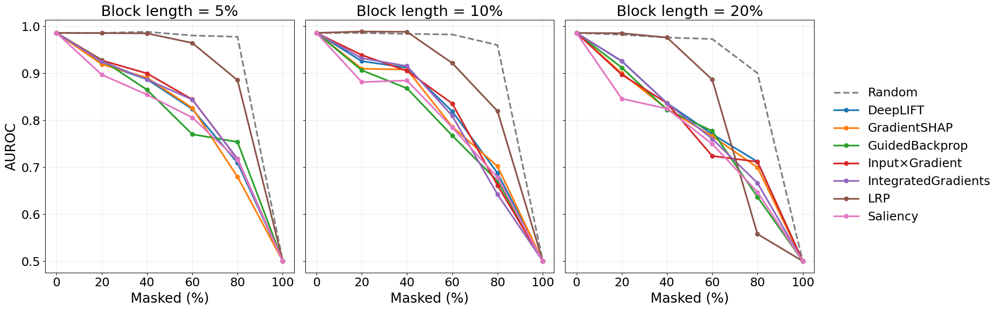

In [2]:
!pip install -q captum zennit scipy

import numpy as np
import torch
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score
from scipy.stats import spearmanr
from tqdm import tqdm
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# ----------------------------------------------------------------------
# Import XAI libraries
# ----------------------------------------------------------------------
from captum.attr import (
    Saliency,
    InputXGradient,
    IntegratedGradients,
    GuidedBackprop,
    DeepLift,
    GradientShap
)

# Zennit for LRP
try:
    from zennit.composites import EpsilonPlus
    HAVE_EPS_PLUS = True
except ImportError:
    HAVE_EPS_PLUS = False

try:
    from zennit.composites import EpsilonGammaBox
    HAVE_GAMMA_BOX = True
except ImportError:
    HAVE_GAMMA_BOX = False

# ----------------------------------------------------------------------
# Configuration
# ----------------------------------------------------------------------
BLOCK_SIZES = [5, 10, 20]  # Block sizes as percentage of gait cycle
MASKING_LEVELS = [0, 20, 40, 60, 80, 100]  # Percentage of blocks to mask
N_ATTR_SAMPLES = 25  # Number of test samples for attribution aggregation
N_RANDOM_REPEATS = 5  # Repeats for random baseline
LRP_EPSILON = 1e-5  # Stabilisation term for LRP (ε-rule)

# XAI method
XAI_METHODS = [
    'Saliency',
    'Input×Gradient',
    'IntegratedGradients',
    'GuidedBackprop',
    'DeepLIFT',
    'GradientSHAP',
    'LRP'
]

# ----------------------------------------------------------------------
# Helper Functions
# ----------------------------------------------------------------------

@torch.no_grad()
def predict_proba(model, X_np, batch_size=256):
    """Return probability of positive class for each sample."""
    model.eval()
    probs = []
    for i in range(0, len(X_np), batch_size):
        xb = torch.tensor(X_np[i:i+batch_size], dtype=torch.float32, device=DEVICE)
        out = torch.softmax(model(xb), dim=1)[:, 1].cpu().numpy()
        probs.append(out)
    return np.concatenate(probs, axis=0)

def compute_auroc(model, X_np, y_np):
    """Compute AUROC on given dataset."""
    probs = predict_proba(model, X_np)
    if len(np.unique(y_np)) < 2:
        return np.nan
    return roc_auc_score(y_np, probs)

def make_time_blocks(T, block_len):
    """Partition time axis into contiguous blocks of given length."""
    blocks = []
    t0 = 0
    while t0 < T:
        t1 = min(T, t0 + block_len)
        blocks.append((t0, t1))
        t0 = t1
    return blocks

def make_channel_time_blocks(C, T, block_len):
    """Create blocks over (channel, time-window)."""
    t_blocks = make_time_blocks(T, block_len)
    all_blocks = []
    for c in range(C):
        for (t0, t1) in t_blocks:
            all_blocks.append((c, t0, t1))
    return all_blocks

def apply_mask_blocks_zero(X, blocks):
    """Zero-fill masked blocks."""
    X_masked = X.copy()
    for (c, t0, t1) in blocks:
        X_masked[:, c, t0:t1] = 0.0
    return X_masked

# ----------------------------------------------------------------------
# Attribution Calculator Class
# ----------------------------------------------------------------------

class AttributionCalculator:
    """Compute attributions for multiple XAI methods."""

    def __init__(self, model, device, lrp_eps=1e-5):
        self.model = model
        self.model.eval()
        self.device = device
        self.lrp_eps = lrp_eps

        # Initialize Captum methods
        self.saliency = Saliency(model)
        self.input_x_gradient = InputXGradient(model)
        self.integrated_gradients = IntegratedGradients(model)
        self.guided_backprop = GuidedBackprop(model)
        self.deeplift = DeepLift(model)
        self.gradient_shap = GradientShap(model)

        # Setup LRP composite
        if HAVE_EPS_PLUS:
            self.lrp_composite = EpsilonPlus(epsilon=self.lrp_eps)
            self.use_lrp = True
        elif HAVE_GAMMA_BOX:
            self.lrp_composite = None  # Will create per-sample
            self.use_lrp = True
        else:
            self.use_lrp = False
            print("Warning: No LRP composite available")

    @torch.no_grad()
    def _get_predicted_class(self, x):
        """Get model's predicted class for input."""
        logits = self.model(x.to(self.device))
        return int(torch.argmax(logits, dim=1).item())

    def _baseline_zeros(self, x):
        """Zero baseline for reference-based methods."""
        return torch.zeros_like(x)

    def _baseline_noise(self, x, n_samples=16, stdev=0.02):
        """Noisy baseline for GradientSHAP."""
        _, c, t = x.shape
        return (torch.zeros((n_samples, c, t), device=x.device) +
                stdev * torch.randn((n_samples, c, t), device=x.device))

    def _compute_lrp(self, x, target):
        """Compute LRP attributions using Zennit."""
        x = x.clone().detach().to(self.device).requires_grad_(True)

        if HAVE_EPS_PLUS:
            # Use EpsilonPlus composite
            with self.lrp_composite.context(self.model) as modified_model:
                out = modified_model(x)
                score = out[0, target]
                grad = torch.autograd.grad(score, x, create_graph=False)[0]
        elif HAVE_GAMMA_BOX:
            # Fallback to EpsilonGammaBox with adaptive bounds
            low = float(x.min().detach().cpu().item())
            high = float(x.max().detach().cpu().item())
            composite = EpsilonGammaBox(low=low, high=high,
                                       epsilon=self.lrp_eps, gamma=0.0)
            with composite.context(self.model) as modified_model:
                out = modified_model(x)
                score = out[0, target]
                grad = torch.autograd.grad(score, x, create_graph=False)[0]
        else:
            raise RuntimeError("No LRP composite available")

        return grad.detach().cpu().numpy()[0]

    def compute(self, x, target=None):
        """
        Compute attributions for all XAI methods.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor of shape (1, C, T)
        target : int, optional
            Target class. If None, uses predicted class.

        Returns
        -------
        dict : Method name -> attribution array (C, T)
        """
        x = x.to(self.device)
        if target is None:
            target = self._get_predicted_class(x)

        x = x.clone().detach().requires_grad_(True)
        baseline_zero = self._baseline_zeros(x)

        attributions = {}

        # Gradient-based methods
        attributions['Saliency'] = self.saliency.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        attributions['Input×Gradient'] = self.input_x_gradient.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        # Reference-based methods
        attributions['IntegratedGradients'] = self.integrated_gradients.attribute(
            x, baselines=baseline_zero, target=target, n_steps=64
        ).detach().cpu().numpy()[0]

        # Guided Backprop
        attributions['GuidedBackprop'] = self.guided_backprop.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        # DeepLIFT
        attributions['DeepLIFT'] = self.deeplift.attribute(
            x, baselines=baseline_zero, target=target
        ).detach().cpu().numpy()[0]

        # GradientSHAP (requires multiple baselines)
        baseline_noise = self._baseline_noise(x, n_samples=16, stdev=0.02)
        attributions['GradientSHAP'] = self.gradient_shap.attribute(
            x, baselines=baseline_noise, target=target,
            n_samples=16, stdevs=0.02
        ).detach().cpu().numpy()[0]

        # LRP (if available)
        if self.use_lrp:
            try:
                attributions['LRP'] = self._compute_lrp(x, target)
            except Exception as e:
                warnings.warn(f"LRP failed: {e}")
                attributions['LRP'] = np.full(x.shape[1:], np.nan)

        return attributions

# ----------------------------------------------------------------------
# Sensitivity Analysis Function
# ----------------------------------------------------------------------

def run_sensitivity_analysis(models_per_fold, X, y, subjects,
                             block_sizes=BLOCK_SIZES,
                             masking_levels=MASKING_LEVELS,
                             n_attr_samples=N_ATTR_SAMPLES,
                             n_random_repeats=N_RANDOM_REPEATS):
    """
    Run sensitivity analysis for all XAI methods across block sizes.

    Parameters
    ----------
    models_per_fold : dict
        Dictionary containing trained models for each fold
    X, y, subjects : arrays
        Data arrays
    block_sizes : list
        Block sizes as percentage of gait cycle
    masking_levels : list
        Percentage of blocks to mask
    n_attr_samples : int
        Number of test samples to use for attribution aggregation
    n_random_repeats : int
        Number of random masking repeats for baseline

    Returns
    -------
    dict : Results organised by block size and fold
    """
    rng = np.random.default_rng(42)
    results = {bs: {} for bs in block_sizes}

    for fold_idx, fold_data in models_per_fold.items():
        print(f"\n{'='*60}")
        print(f"Processing Fold {fold_idx}")
        print(f"{'='*60}")

        # Get model and subject splits
        model = fold_data["model"].to(DEVICE).eval()
        train_subjects = np.array(fold_data["train_subjects"], dtype=object)
        test_subjects = np.array(fold_data["test_subjects"], dtype=object)

        # Create train/test masks
        train_mask = np.isin(subjects, train_subjects)
        test_mask = np.isin(subjects, test_subjects)

        X_train, y_train = X[train_mask], y[train_mask]
        X_test, y_test = X[test_mask], y[test_mask]

        # Normalize using training statistics only
        mean = X_train.mean(axis=(0, 2), keepdims=True)
        std = X_train.std(axis=(0, 2), keepdims=True) + 1e-8
        X_test_norm = (X_test - mean) / std

        # Get baseline AUROC on clean test set
        base_auc = compute_auroc(model, X_test_norm, y_test)
        print(f"Baseline AUROC: {base_auc:.4f}")

        # Process each block size
        for block_size in block_sizes:
            # Calculate actual block length in timepoints
            T = X.shape[2]
            block_len = max(1, int(round(T * block_size / 100)))

            # Create blocks
            C = X.shape[1]
            blocks = make_channel_time_blocks(C, T, block_len)
            n_blocks = len(blocks)

            print(f"\n  Block size: {block_size}% ({block_len} timepoints, {n_blocks} blocks)")

            # ----- Random masking baseline -----
            rand_aucs = []
            for k in masking_levels:
                if k == 0:
                    rand_aucs.append(base_auc)
                    continue

                n_mask = int(round(n_blocks * k / 100))
                n_mask = max(1, min(n_mask, n_blocks))

                fold_aucs = []
                for _ in range(n_random_repeats):
                    chosen = rng.choice(n_blocks, size=n_mask, replace=False)
                    mask_blocks = [blocks[i] for i in chosen]
                    X_masked = apply_mask_blocks_zero(X_test_norm, mask_blocks)
                    fold_aucs.append(compute_auroc(model, X_masked, y_test))

                rand_aucs.append(float(np.nanmean(fold_aucs)))

            # ----- Attribution-based masking -----
            # Select random subset of test samples for attribution
            n_pick = min(n_attr_samples, len(X_test_norm))
            sample_idx = rng.choice(len(X_test_norm), size=n_pick, replace=False)
            X_sample = X_test_norm[sample_idx]

            # Compute attributions
            attr_calc = AttributionCalculator(model, DEVICE, lrp_eps=LRP_EPSILON)
            method_maps = {method: [] for method in XAI_METHODS}

            for i in tqdm(range(n_pick), desc=f"  Computing attributions"):
                x_tensor = torch.tensor(X_sample[i:i+1], dtype=torch.float32)
                attrs = attr_calc.compute(x_tensor, target=None)

                for method in XAI_METHODS:
                    if method in attrs and attrs[method] is not None:
                        # Use absolute attributions for ranking
                        method_maps[method].append(np.abs(attrs[method]))

            # Average attributions across samples
            method_avg_map = {}
            for method in XAI_METHODS:
                if len(method_maps[method]) > 0:
                    method_avg_map[method] = np.mean(np.stack(method_maps[method]), axis=0)

            # Compute AUROC drops for each method
            for method, attr_map in method_avg_map.items():
                # Score each block by sum of absolute attribution
                block_scores = np.zeros(n_blocks)
                for bi, (c, t0, t1) in enumerate(blocks):
                    block_scores[bi] = np.sum(attr_map[c, t0:t1])

                # Rank blocks by importance
                ranked_blocks = np.argsort(block_scores)[::-1]

                # Progressive masking
                method_aucs = []
                for k in masking_levels:
                    if k == 0:
                        method_aucs.append(base_auc)
                        continue

                    n_mask = int(round(n_blocks * k / 100))
                    n_mask = max(1, min(n_mask, n_blocks))

                    chosen = ranked_blocks[:n_mask]
                    mask_blocks = [blocks[i] for i in chosen]
                    X_masked = apply_mask_blocks_zero(X_test_norm, mask_blocks)
                    method_aucs.append(compute_auroc(model, X_masked, y_test))

                # Store results
                if block_size not in results:
                    results[block_size] = {}
                if fold_idx not in results[block_size]:
                    results[block_size][fold_idx] = {}

                results[block_size][fold_idx][method] = {
                    'masking_levels': list(masking_levels),
                    'aucs_top': method_aucs,
                    'aucs_random': rand_aucs,
                    'base_auc': base_auc
                }

    return results

# ----------------------------------------------------------------------
# Plotting Function
# ----------------------------------------------------------------------

def plot_sensitivity_side_by_side(
    results_by_blocklen,
    figsize=(20, 6.5),
    label_font=20,
    tick_font=18,
    title_font=22,
    legend_font=18,
    lw=2.5,
    ms=6
):
    block_lens = sorted(results_by_blocklen.keys())
    ncols = len(block_lens)

    fig, axes = plt.subplots(1, ncols, figsize=figsize, sharey=True)

    if ncols == 1:
        axes = [axes]

    # Collect all methods across all folds
    all_methods = set()
    for bl in block_lens:
        for fold in results_by_blocklen[bl]:
            all_methods |= set(results_by_blocklen[bl][fold].keys())
    all_methods = sorted(list(all_methods))

    legend_handles = None
    legend_labels = None

    for ax, bl in zip(axes, block_lens):

        results = results_by_blocklen[bl]

        # Get ks
        ks = None
        for fold in results:
            if len(results[fold]) > 0:
                ks = next(iter(results[fold].values()))["masking_levels"]
                break

        if ks is None:
            continue

        # ---- Random baseline ----
        rand_curves = []
        for fold in results:
            if len(results[fold]) == 0:
                continue
            first_method = next(iter(results[fold].keys()))
            rand_curves.append(np.array(results[fold][first_method]["aucs_random"]))

        if len(rand_curves):
            rand_mean = np.nanmean(np.vstack(rand_curves), axis=0)
            ax.plot(
                ks,
                rand_mean,
                linestyle="--",
                color="grey",
                linewidth=lw,
                label="Random"
            )

        # ---- Methods ----
        for method in all_methods:
            curves = []
            for fold in results:
                if method in results[fold]:
                    curves.append(np.array(results[fold][method]["aucs_top"]))

            if not curves:
                continue

            mean_curve = np.nanmean(np.vstack(curves), axis=0)

            ax.plot(
                ks,
                mean_curve,
                marker="o",
                linewidth=lw,
                markersize=ms,
                label=method
            )

        ax.set_title(f"Block length = {bl}%", fontsize=title_font)
        ax.set_xlabel("Masked (%)", fontsize=label_font)
        ax.tick_params(axis="both", labelsize=tick_font)
        ax.grid(alpha=0.25)

        if ax is axes[0]:
            ax.set_ylabel("AUROC", fontsize=label_font)

        # Store legend handles once
        if legend_handles is None:
            legend_handles, legend_labels = ax.get_legend_handles_labels()

    # ---- Shared legend ----
    fig.legend(
        legend_handles,
        legend_labels,
        loc="center left",
        bbox_to_anchor=(0.85, 0.5),
        frameon=False,
        fontsize=legend_font
    )

    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

# ----------------------------------------------------------------------
# Run Sensitivity Analysis
# ----------------------------------------------------------------------

print("\n" + "="*60)
print("RUNNING SENSITIVITY ANALYSIS")
print("="*60)
print(f"Block sizes: {BLOCK_SIZES}%")
print(f"Masking levels: {MASKING_LEVELS}%")
print(f"Attribution samples per fold: {N_ATTR_SAMPLES}")
print(f"Random repeats: {N_RANDOM_REPEATS}")

# Run the analysis
sensitivity_results = run_sensitivity_analysis(
    models_per_fold=models_per_fold,
    X=X, y=y, subjects=subjects,
    block_sizes=BLOCK_SIZES,
    masking_levels=MASKING_LEVELS,
    n_attr_samples=N_ATTR_SAMPLES,
    n_random_repeats=N_RANDOM_REPEATS
)

# Plot results using your original format
plot_sensitivity_side_by_side(sensitivity_results)

#### **Test 2a: Weight Randomisation Test**

This test evaluates whether explanations reflect learned representations by progressively randomising model weights and measuring changes in attribution similarity.

**What this test does:**
- Five progressive randomisation levels are applied: intact reference (R0), classification head (R1), last convolutional block (R2), last two blocks (R3), and all layers (R4).
- Attribution maps from randomised models are compared against the reference model using the same test samples.
- Similarity is quantified using Spearman correlation (overall rank agreement) and Jaccard overlap at top 10%, 30%, and 50% (spatial agreement of salient regions).

**Key metrics:**
- Spearman correlation (ρ) across randomisation levels
- Top-k Jaccard overlap at 10%, 30%, and 50% thresholds

**Expected result:**
If an XAI method faithfully reflects learned representations, attribution similarity should progressively decline as randomisation depth increases. Methods retaining high similarity under full randomisation (R4) may reflect architectural artefacts rather than task-relevant learning.


RUNNING FAITHFULNESS ANALYSIS - WEIGHT RANDOMISATION
Test samples per fold: 20
Jaccard thresholds: 10%, 30%, 50%
XAI methods: Saliency, Input×Gradient, IntegratedGradients, GuidedBackprop, DeepLIFT, GradientSHAP, LRP

Fold 1 | Train samples: 580 | Test samples: 140
Computing reference attributions (R0)...


Reference attributions: 100%|██████████| 20/20 [00:00<00:00, 28.13it/s]



Randomisation level R0...

Randomisation level R1...

Randomisation level R2...

Randomisation level R3...

Randomisation level R4...

Fold 2 | Train samples: 560 | Test samples: 160
Computing reference attributions (R0)...


Reference attributions: 100%|██████████| 20/20 [00:00<00:00, 27.38it/s]



Randomisation level R0...

Randomisation level R1...

Randomisation level R2...

Randomisation level R3...

Randomisation level R4...

Fold 3 | Train samples: 580 | Test samples: 140
Computing reference attributions (R0)...


Reference attributions: 100%|██████████| 20/20 [00:00<00:00, 21.84it/s]



Randomisation level R0...

Randomisation level R1...

Randomisation level R2...

Randomisation level R3...

Randomisation level R4...

Fold 4 | Train samples: 580 | Test samples: 140
Computing reference attributions (R0)...


Reference attributions: 100%|██████████| 20/20 [00:00<00:00, 21.37it/s]



Randomisation level R0...

Randomisation level R1...

Randomisation level R2...

Randomisation level R3...

Randomisation level R4...

Fold 5 | Train samples: 580 | Test samples: 140
Computing reference attributions (R0)...


Reference attributions: 100%|██████████| 20/20 [00:00<00:00, 28.40it/s]



Randomisation level R0...

Randomisation level R1...

Randomisation level R2...

Randomisation level R3...

Randomisation level R4...


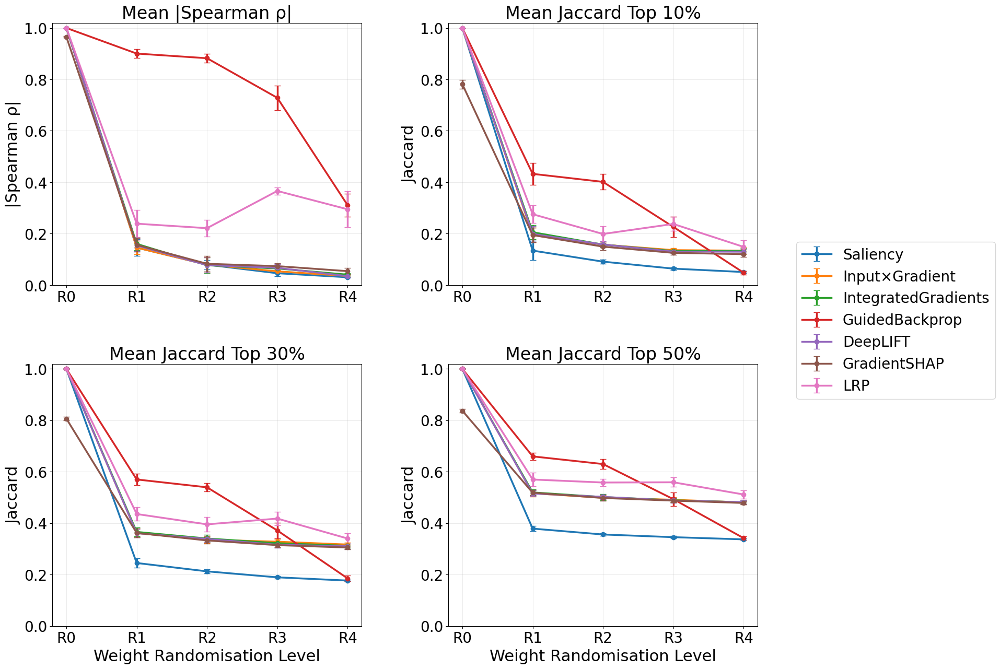


✅ Faithfulness analysis (weight randomisation) complete.


In [5]:
!pip install -q captum zennit scipy

import os
import copy
import warnings
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from scipy.stats import spearmanr

from captum.attr import (
    Saliency,
    InputXGradient,
    IntegratedGradients,
    GuidedBackprop,
    DeepLift,
    GradientShap,
)

# Suppress warnings
warnings.filterwarnings("ignore", message="Setting backward hooks on ReLU activations")
warnings.filterwarnings("ignore", message="Setting forward, backward hooks and attributes on non-linear")

# ----------------------------------------------------------------------
# Zennit for LRP
# ----------------------------------------------------------------------
try:
    from zennit.composites import EpsilonPlus
    HAVE_EPS_PLUS = True
except ImportError:
    HAVE_EPS_PLUS = False

try:
    from zennit.composites import EpsilonGammaBox
    HAVE_GAMMA_BOX = True
except ImportError:
    HAVE_GAMMA_BOX = False

assert (HAVE_EPS_PLUS or HAVE_GAMMA_BOX), "Zennit missing required composites"

# ----------------------------------------------------------------------
# Progressive Weight Randomisation
# ----------------------------------------------------------------------

def progressive_weight_randomisation_cnn1d(model, level, std=0.1):
    """
    Create progressively randomised copy of CNN1D.

    Levels:
        R0 = no randomisation
        R1 = classifier only
        R2 = last conv layer (conv_layers.6)
        R3 = middle conv layer (conv_layers.3)
        R4 = all layers
    """
    m = copy.deepcopy(model)
    if level == 0:
        return m

    with torch.no_grad():
        # R4: full network
        if level >= 4:
            for _, p in m.named_parameters():
                nn.init.normal_(p, 0, std)
            return m

        for name, p in m.named_parameters():
            if level >= 1 and name.startswith("classifier"):
                nn.init.normal_(p, 0, std)
            if level >= 2 and name.startswith("conv_layers.6"):
                nn.init.normal_(p, 0, std)
            if level >= 3 and name.startswith("conv_layers.3"):
                nn.init.normal_(p, 0, std)
    return m

# ----------------------------------------------------------------------
# Similarity Metrics
# ----------------------------------------------------------------------

def spearman_corr(a, b):
    """Spearman rank correlation between two attribution maps."""
    a, b = a.flatten(), b.flatten()
    rho, _ = spearmanr(a, b)
    if rho is None or np.isnan(rho):
        return 0.0
    return float(rho)

def jaccard_topk(a, b, frac=0.1):
    """Jaccard overlap of top-k% features by absolute attribution."""
    a, b = np.abs(a).flatten(), np.abs(b).flatten()
    k = max(1, int(frac * len(a)))
    top_a = set(np.argsort(a)[-k:])
    top_b = set(np.argsort(b)[-k:])
    inter = len(top_a & top_b)
    union = len(top_a | top_b)
    return float(inter / union) if union > 0 else 0.0

# ----------------------------------------------------------------------
# Attribution Calculator (with LRP support)
# ----------------------------------------------------------------------

class AttributionCalculator:
    """Compute attributions for multiple XAI methods."""

    def __init__(self, model, device=None, lrp_eps=1e-5):
        self.model = model
        self.model.eval()
        self.device = device if device is not None else next(model.parameters()).device
        self.lrp_eps = lrp_eps

        # Captum methods
        self.saliency = Saliency(self.model)
        self.input_x_gradient = InputXGradient(self.model)
        self.integrated_gradients = IntegratedGradients(self.model)
        self.guided_backprop = GuidedBackprop(self.model)
        self.deeplift = DeepLift(self.model)
        self.gradient_shap = GradientShap(self.model)

        # Zennit LRP setup
        if HAVE_EPS_PLUS:
            self.lrp_composite = EpsilonPlus(epsilon=self.lrp_eps)
            self.use_global_composite = True
        else:
            self.lrp_composite = None
            self.use_global_composite = False

    def _baseline_zeros(self, x):
        """Zero baseline for reference-based methods."""
        return torch.zeros_like(x)

    def _baseline_noise(self, x, n=16, stdev=0.02):
        """Noisy baseline for GradientSHAP."""
        _, c, t = x.shape
        return (torch.zeros((n, c, t), device=x.device) +
                stdev * torch.randn((n, c, t), device=x.device))

    @torch.no_grad()
    def _get_predicted_class(self, x):
        """Get model's predicted class."""
        logits = self.model(x)
        return int(torch.argmax(logits, dim=1).item())

    def _compute_lrp(self, x, target):
        """Compute LRP attributions using Zennit."""
        x = x.clone().detach().to(self.device).requires_grad_(True)

        if self.use_global_composite:
            ctx = self.lrp_composite.context(self.model)
        else:
            low = float(x.min().detach().cpu().item())
            high = float(x.max().detach().cpu().item())
            composite = EpsilonGammaBox(low=low, high=high,
                                       epsilon=self.lrp_eps, gamma=0.0)
            ctx = composite.context(self.model)

        with ctx:
            out = self.model(x)
            score = out[0, target]
            relevance = torch.autograd.grad(score, x, retain_graph=False)[0]

        return relevance.detach().cpu().numpy()[0]

    def compute(self, x, target=None):
        """
        Compute attributions for all XAI methods.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor of shape (1, C, T)
        target : int, optional
            Target class. If None, uses predicted class.

        Returns
        -------
        dict : Method name -> attribution array (C, T)
        """
        x = x.to(self.device)

        if target is None:
            with torch.no_grad():
                target = self._get_predicted_class(x)

        x = x.clone().detach().requires_grad_(True)
        baseline_zero = self._baseline_zeros(x)

        attributions = {}

        # Captum methods
        attributions["Saliency"] = self.saliency.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        attributions["Input×Gradient"] = self.input_x_gradient.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        attributions["IntegratedGradients"] = self.integrated_gradients.attribute(
            x, baselines=baseline_zero, target=target, n_steps=64
        ).detach().cpu().numpy()[0]

        attributions["GuidedBackprop"] = self.guided_backprop.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        attributions["DeepLIFT"] = self.deeplift.attribute(
            x, baselines=baseline_zero, target=target
        ).detach().cpu().numpy()[0]

        baseline_noise = self._baseline_noise(x, n=16, stdev=0.02)
        attributions["GradientSHAP"] = self.gradient_shap.attribute(
            x, baselines=baseline_noise, target=target,
            n_samples=16, stdevs=0.02
        ).detach().cpu().numpy()[0]

        # LRP (Zennit)
        try:
            attributions["LRP"] = self._compute_lrp(x, target)
        except Exception as e:
            warnings.warn(f"LRP failed: {repr(e)}")
            attributions["LRP"] = np.full(x.shape[1:], np.nan, dtype=np.float32)

        return attributions

# ----------------------------------------------------------------------
# Faithfulness Evaluation (Weight Randomisation)
# ----------------------------------------------------------------------

def evaluate_weight_randomisation(models_per_fold, X, y, subjects, device,
                                  n_samples=20, lrp_eps=1e-5,
                                  jaccard_fracs=(0.10, 0.30, 0.50)):
    """
    Evaluate faithfulness via progressive weight randomisation.

    Parameters
    ----------
    models_per_fold : dict
        Trained models for each fold
    X, y, subjects : arrays
        Data arrays
    device : torch.device
        Device for computation
    n_samples : int
        Number of test samples to use
    lrp_eps : float
        Epsilon stabilisation for LRP
    jaccard_fracs : tuple
        Fractions for top-k Jaccard overlap

    Returns
    -------
    dict : Results organised by fold and method
    """
    methods = [
        "Saliency", "Input×Gradient", "IntegratedGradients",
        "GuidedBackprop", "DeepLIFT", "GradientSHAP", "LRP"
    ]

    results = {}
    jac_keys = {frac: f"jaccard_top{int(round(frac*100))}" for frac in jaccard_fracs}

    for fold_key, fold_data in models_per_fold.items():
        base_model = fold_data["model"]
        train_subjects = np.array(fold_data["train_subjects"], dtype=object)
        test_subjects = np.array(fold_data["test_subjects"], dtype=object)

        # Create train/test masks
        train_mask = np.isin(subjects, train_subjects)
        test_mask = np.isin(subjects, test_subjects)

        X_train = X[train_mask]
        X_test = X[test_mask]

        if len(X_test) == 0:
            continue

        if len(X_train) == 0:
            warnings.warn(f"Fold {fold_key}: train subjects not found")
            X_train = X_test

        # Normalize using training statistics
        mean = X_train.mean(axis=(0, 2), keepdims=True)
        std = X_train.std(axis=(0, 2), keepdims=True) + 1e-8
        X_test_norm = (X_test - mean) / std

        print(f"\n{'='*60}")
        print(f"Fold {fold_key} | Train samples: {len(X_train)} | Test samples: {len(X_test)}")
        print(f"{'='*60}")

        # Create data loader
        loader = DataLoader(
            TensorDataset(torch.tensor(X_test_norm, dtype=torch.float32)),
            batch_size=1, shuffle=False
        )

        base_model = base_model.to(device).eval()

        # Select fixed sample set
        sample_x = []
        for (xb,) in loader:
            sample_x.append(xb)
            if len(sample_x) >= n_samples:
                break
        sample_x = torch.cat(sample_x, dim=0)

        # Compute reference attributions (R0)
        print("Computing reference attributions (R0)...")
        attr_calc = AttributionCalculator(base_model, device=device, lrp_eps=lrp_eps)

        ref_attr = {m: [] for m in methods}
        for i in tqdm(range(len(sample_x)), desc="Reference attributions"):
            attrs = attr_calc.compute(sample_x[i:i+1], target=None)
            for m in methods:
                ref_attr[m].append(attrs[m])

        # Initialize results for this fold
        fold_results = {}
        for m in methods:
            fold_results[m] = {"spearman_ref": []}
            for frac in jaccard_fracs:
                fold_results[m][jac_keys[frac]] = []

        # Test each randomisation level
        for level in range(5):
            print(f"\nRandomisation level R{level}...")

            # Create randomised model
            rand_model = progressive_weight_randomisation_cnn1d(base_model, level)
            rand_model = rand_model.to(device).eval()
            rand_calc = AttributionCalculator(rand_model, device=device, lrp_eps=lrp_eps)

            # Compute similarities
            for m in methods:
                spearman_values = []
                jaccard_values = {frac: [] for frac in jaccard_fracs}

                for i in range(len(sample_x)):
                    a_ref = ref_attr[m][i]
                    a_rand = rand_calc.compute(sample_x[i:i+1], target=None)[m]

                    if np.isnan(a_ref).any() or np.isnan(a_rand).any():
                        continue

                    # Spearman correlation (absolute value as in paper)
                    rho = abs(spearman_corr(a_ref, a_rand))
                    spearman_values.append(rho)

                    # Jaccard overlap at different thresholds
                    for frac in jaccard_fracs:
                        jacc = jaccard_topk(a_ref, a_rand, frac=frac)
                        jaccard_values[frac].append(jacc)

                # Store averaged results
                fold_results[m]["spearman_ref"].append(
                    float(np.mean(spearman_values)) if spearman_values else float("nan")
                )

                for frac in jaccard_fracs:
                    key = jac_keys[frac]
                    fold_results[m][key].append(
                        float(np.mean(jaccard_values[frac])) if jaccard_values[frac] else float("nan")
                    )

        results[f"fold{fold_key}"] = fold_results

    return results

# ----------------------------------------------------------------------
# Plotting Function
# ----------------------------------------------------------------------

def plot_fold_averaged_curves(
    results,
    figsize=(23, 10),
    label_font=20,
    tick_font=18,
    title_font=22,
    legend_font=18,
    lw=2.5,
    ms=6,
    capsize=4,
    show_sem=True,
    legend_anchor=(0.85, 0.5),
    legend_loc="center left",
    right_margin=0.80,
    wspace=0.28,
    hspace=0.30
):

    lvls = ["R0", "R1", "R2", "R3", "R4"]
    x = np.arange(len(lvls))

    # Get method names
    any_fold = next(iter(results.values()))
    methods = list(any_fold.keys())

    metrics = [
        ("spearman_ref",  "Mean |Spearman ρ|", "|Spearman ρ|", (0, 1.02)),
        ("jaccard_top10", "Mean Jaccard Top 10%", "Jaccard", (0, 1.02)),
        ("jaccard_top30", "Mean Jaccard Top 30%", "Jaccard", (0, 1.02)),
        ("jaccard_top50", "Mean Jaccard Top 50%", "Jaccard", (0, 1.02)),
    ]

    # Collect fold-level data
    metric_data = {mkey: {meth: [] for meth in methods} for (mkey, *_ ) in metrics}

    for fold_key, fold_dict in results.items():
        for meth in methods:
            for (mkey, *_ ) in metrics:
                if mkey in fold_dict[meth]:
                    metric_data[mkey][meth].append(
                        np.array(fold_dict[meth][mkey], dtype=float)
                    )

    # Create figure
    fig, axes = plt.subplots(2, 2, figsize=figsize, sharex=True)
    axes = axes.flatten()
    fig.subplots_adjust(right=right_margin, wspace=wspace, hspace=hspace)

    legend_handles = None
    legend_labels = None

    for ax, (mkey, title, ylabel, ylim) in zip(axes, metrics):

        for meth in methods:
            # Check if we have data for this method
            if len(metric_data[mkey][meth]) == 0:
                continue

            # Stack data across folds
            mat = np.vstack(metric_data[mkey][meth])
            mean = np.nanmean(mat, axis=0)

            if show_sem:
                n_eff = np.sum(~np.isnan(mat), axis=0).clip(min=1)
                sem = np.nanstd(mat, axis=0, ddof=1) / np.sqrt(n_eff)
                ax.errorbar(
                    x, mean, yerr=sem,
                    marker="o",
                    linewidth=lw,
                    markersize=ms,
                    capsize=capsize,
                    label=meth
                )
            else:
                ax.plot(
                    x, mean,
                    marker="o",
                    linewidth=lw,
                    markersize=ms,
                    label=meth
                )

        ax.set_title(title, fontsize=title_font)
        ax.set_ylabel(ylabel, fontsize=label_font)
        ax.set_ylim(*ylim)
        ax.set_xticks(x)
        ax.set_xticklabels(lvls, fontsize=tick_font)
        ax.tick_params(axis="y", labelsize=tick_font)
        ax.grid(True, alpha=0.25)

        if legend_handles is None:
            legend_handles, legend_labels = ax.get_legend_handles_labels()

    # Bottom row x-labels
    axes[2].set_xlabel("Weight Randomisation Level", fontsize=label_font)
    axes[3].set_xlabel("Weight Randomisation Level", fontsize=label_font)

    # Keep top row tick labels visible
    axes[0].tick_params(labelbottom=True)
    axes[1].tick_params(labelbottom=True)

    # Shared legend
    fig.legend(
        legend_handles,
        legend_labels,
        loc=legend_loc,
        bbox_to_anchor=legend_anchor,
        fontsize=legend_font,
        frameon=True
    )

    plt.show()

# ----------------------------------------------------------------------
# Run Faithfulness Analysis (Weight Randomisation)
# ----------------------------------------------------------------------

print("\n" + "="*60)
print("RUNNING FAITHFULNESS ANALYSIS - WEIGHT RANDOMISATION")
print("="*60)
print(f"Test samples per fold: 20")
print(f"Jaccard thresholds: 10%, 30%, 50%")
print(f"XAI methods: Saliency, Input×Gradient, IntegratedGradients, GuidedBackprop, DeepLIFT, GradientSHAP, LRP")

# Run the analysis
faithfulness_results = evaluate_weight_randomisation(
    models_per_fold=models_per_fold,
    X=X, y=y, subjects=subjects,
    device=DEVICE,
    n_samples=20,
    lrp_eps=1e-5,
    jaccard_fracs=(0.10, 0.30, 0.50)
)

# Plot results using your original format
plot_fold_averaged_curves(
    faithfulness_results,
    figsize=(20, 15),
    label_font=22,
    tick_font=20,
    title_font=24,
    legend_font=20,
    legend_anchor=(0.83, 0.5),
    right_margin=0.80
)

print("\n Faithfulness analysis (weight randomisation) complete.")

#### **Test 2b: Label Randomisation Test**

This test evaluates whether explanations reflect learned representations by progressively corrupting training labels and measuring changes in attribution similarity.

**What this test does:**
- Five progressive label corruption levels are applied: 0%, 25%, 50%, 75%, and 100% of training labels shuffled.
- Models are retrained at each corruption level and attribution maps are compared against the reference model (trained on true labels) using the same test samples.
- Similarity is quantified using Spearman correlation (overall rank agreement) and Jaccard overlap at top 10%, 30%, and 50% (spatial agreement of salient regions).

**Key metrics:**
- Spearman correlation (ρ) across corruption levels
- Top-k Jaccard overlap at 10%, 30%, and 50% thresholds
- Validation accuracy to confirm corruption effect

**Expected result:**
If an XAI method faithfully reflects learned representations, attribution similarity should progressively decline as label corruption increases. Methods retaining high similarity under full randomisation (100% corrupted labels) may reflect input data artefacts rather than task-relevant learning.

In [9]:
!pip install -q captum zennit scipy

import os
import warnings
import random
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from scipy.stats import spearmanr

from captum.attr import (
    Saliency,
    InputXGradient,
    IntegratedGradients,
    GuidedBackprop,
    DeepLift,
    GradientShap,
)

warnings.filterwarnings("ignore", message="Setting backward hooks on ReLU activations")
warnings.filterwarnings("ignore", message="Setting forward, backward hooks and attributes on non-linear")

# ----------------------------------------------------------------------
# Determinism helpers
# ----------------------------------------------------------------------
def set_all_seeds(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

def set_torch_deterministic():
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_torch_deterministic()

# ----------------------------------------------------------------------
# Zennit for LRP
# ----------------------------------------------------------------------
try:
    from zennit.composites import EpsilonPlus
    HAVE_EPS_PLUS = True
except ImportError:
    HAVE_EPS_PLUS = False

try:
    from zennit.composites import EpsilonGammaBox
    HAVE_GAMMA_BOX = True
except ImportError:
    HAVE_GAMMA_BOX = False

assert (HAVE_EPS_PLUS or HAVE_GAMMA_BOX), "Zennit missing required composites"

# ----------------------------------------------------------------------
# Similarity Metrics
# ----------------------------------------------------------------------
def spearman_corr(a, b):
    """Spearman rank correlation between two attribution maps."""
    a, b = a.flatten(), b.flatten()
    rho, _ = spearmanr(a, b)
    if rho is None or np.isnan(rho):
        return 0.0
    return float(rho)

def jaccard_topk(a, b, frac=0.1):
    """Jaccard overlap of top-k% features by absolute attribution."""
    a, b = np.abs(a).flatten(), np.abs(b).flatten()
    k = max(1, int(frac * len(a)))
    top_a = set(np.argsort(a)[-k:])
    top_b = set(np.argsort(b)[-k:])
    inter = len(top_a & top_b)
    union = len(top_a | top_b)
    return float(inter / union) if union > 0 else 0.0

# ----------------------------------------------------------------------
# Subject-wise split inside training
# ----------------------------------------------------------------------
def split_train_val_subjectwise(X_tr, y_tr, subj_tr, val_frac=0.2, seed=42):
    """Create subject-stratified validation split."""
    rng = np.random.default_rng(seed)
    unique_subs = np.unique(subj_tr)
    rng.shuffle(unique_subs)
    n_val = max(1, int(len(unique_subs) * val_frac))
    val_subs = unique_subs[:n_val]
    train_mask = ~np.isin(subj_tr, val_subs)
    val_mask = np.isin(subj_tr, val_subs)
    return X_tr[train_mask], y_tr[train_mask], X_tr[val_mask], y_tr[val_mask]

def standardise_from_train(X_train, X_list):
    """Normalize using training statistics only."""
    mean = X_train.mean(axis=(0, 2), keepdims=True)
    std = X_train.std(axis=(0, 2), keepdims=True) + 1e-8
    norm = lambda A: (A - mean) / std
    return norm(X_train), [norm(A) for A in X_list]

def make_loaders(X_train, y_train, X_val, y_val, bs=256, seed=42):
    """Create data loaders with fixed seed for reproducibility."""
    gen = torch.Generator()
    gen.manual_seed(seed)

    tr_ds = TensorDataset(
        torch.tensor(X_train, dtype=torch.float32),
        torch.tensor(y_train, dtype=torch.long)
    )
    va_ds = TensorDataset(
        torch.tensor(X_val, dtype=torch.float32),
        torch.tensor(y_val, dtype=torch.long)
    )

    tr = DataLoader(tr_ds, batch_size=bs, shuffle=True, generator=gen, num_workers=0)
    va = DataLoader(va_ds, batch_size=bs, shuffle=False, num_workers=0)
    return tr, va

# ----------------------------------------------------------------------
# Label corruption
# ----------------------------------------------------------------------
def shuffle_labels_fraction(y, frac, seed=42):
    """Shuffle a fraction of labels."""
    y_new = y.copy()
    rng = np.random.default_rng(seed)
    n = len(y)
    n_classes = len(np.unique(y))

    if frac <= 0:
        return y_new
    if frac >= 1.0:
        return rng.integers(low=0, high=n_classes, size=n)

    idx = rng.choice(n, size=max(1, int(n * frac)), replace=False)
    y_new[idx] = rng.integers(low=0, high=n_classes, size=len(idx))
    return y_new

# ----------------------------------------------------------------------
# Training and Evaluation
# ----------------------------------------------------------------------
def train_model(model, train_loader, val_loader, device, epochs=60, lr=1e-3, patience=10):
    """Train model with early stopping."""
    model = model.to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    crit = nn.CrossEntropyLoss()

    best_loss, wait, best_state = float("inf"), 0, None

    for _ in range(epochs):
        model.train()
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            opt.zero_grad()
            loss = crit(model(xb), yb)
            loss.backward()
            opt.step()

        model.eval()
        val_loss, n = 0.0, 0
        with torch.no_grad():
            for xb, yb in val_loader:
                xb, yb = xb.to(device), yb.to(device)
                val_loss += crit(model(xb), yb).item() * len(yb)
                n += len(yb)
        val_loss /= max(1, n)

        if val_loss < best_loss:
            best_loss, wait = val_loss, 0
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
        else:
            wait += 1
            if wait >= patience:
                break

    if best_state is not None:
        model.load_state_dict(best_state)
    return model

def eval_accuracy(model, loader, device):
    """Evaluate model accuracy."""
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb).argmax(dim=1)
            correct += (pred == yb).sum().item()
            total += len(yb)
    return correct / max(1, total)

# ----------------------------------------------------------------------
# Attribution Calculator (with LRP support)
# ----------------------------------------------------------------------
class AttributionCalculator:
    """Compute attributions for multiple XAI methods."""

    def __init__(self, model, device=None, lrp_eps=1e-5):
        self.model = model.eval()
        self.device = device if device is not None else next(model.parameters()).device
        self.lrp_eps = lrp_eps

        # Captum methods
        self.saliency = Saliency(self.model)
        self.input_x_gradient = InputXGradient(self.model)
        self.integrated_gradients = IntegratedGradients(self.model)
        self.guided_backprop = GuidedBackprop(self.model)
        self.deeplift = DeepLift(self.model)
        self.gradient_shap = GradientShap(self.model)

        # Zennit LRP setup
        if HAVE_EPS_PLUS:
            self.lrp_composite = EpsilonPlus(epsilon=self.lrp_eps)
            self.use_global = True
        else:
            self.lrp_composite = None
            self.use_global = False

    @torch.no_grad()
    def _get_predicted_class(self, x):
        """Get model's predicted class."""
        logits = self.model(x.to(self.device))
        return int(torch.argmax(logits, dim=1).item())

    def _baseline_zeros(self, x):
        """Zero baseline for reference-based methods."""
        return torch.zeros_like(x)

    def _baseline_noise(self, x, n=16, stdev=0.02):
        """Noisy baseline for GradientSHAP."""
        _, c, t = x.shape
        return (torch.zeros((n, c, t), device=x.device) +
                stdev * torch.randn((n, c, t), device=x.device))

    def _compute_lrp(self, x, target):
        """Compute LRP attributions using Zennit."""
        x = x.clone().detach().to(self.device).requires_grad_(True)

        if self.use_global:
            ctx = self.lrp_composite.context(self.model)
        else:
            low = float(x.min().detach().cpu().item())
            high = float(x.max().detach().cpu().item())
            composite = EpsilonGammaBox(low=low, high=high,
                                       epsilon=self.lrp_eps, gamma=0.0)
            ctx = composite.context(self.model)

        with ctx:
            out = self.model(x)
            score = out[0, target]
            relevance = torch.autograd.grad(score, x, retain_graph=False)[0]

        return relevance.detach().cpu().numpy()[0]

    def compute(self, x, target):
        """
        Compute attributions for all XAI methods.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor of shape (1, C, T)
        target : int
            Target class for attribution

        Returns
        -------
        dict : Method name -> attribution array (C, T)
        """
        x = x.to(self.device).clone().detach().requires_grad_(True)
        baseline_zero = self._baseline_zeros(x)

        attributions = {}

        # Captum methods
        attributions["Saliency"] = self.saliency.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        attributions["Input×Gradient"] = self.input_x_gradient.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        attributions["IntegratedGradients"] = self.integrated_gradients.attribute(
            x, baselines=baseline_zero, target=target, n_steps=64
        ).detach().cpu().numpy()[0]

        attributions["GuidedBackprop"] = self.guided_backprop.attribute(
            x, target=target
        ).detach().cpu().numpy()[0]

        attributions["DeepLIFT"] = self.deeplift.attribute(
            x, baselines=baseline_zero, target=target
        ).detach().cpu().numpy()[0]

        baseline_noise = self._baseline_noise(x, n=16, stdev=0.02)
        attributions["GradientSHAP"] = self.gradient_shap.attribute(
            x, baselines=baseline_noise, target=target,
            n_samples=16, stdevs=0.02
        ).detach().cpu().numpy()[0]

        # LRP (Zennit)
        try:
            attributions["LRP"] = self._compute_lrp(x, target)
        except Exception as e:
            warnings.warn(f"LRP failed: {repr(e)}")
            attributions["LRP"] = np.full(x.shape[1:], np.nan, dtype=np.float32)

        return attributions

# ----------------------------------------------------------------------
# Label Randomisation Evaluation
# ----------------------------------------------------------------------

def evaluate_label_randomisation(
    models_per_fold,
    X, y, subjects,
    device,
    n_samples=20,
    levels=(0.0, 0.25, 0.5, 0.75, 1.0),
    seed=42,
    bs=256,
    epochs=60,
    lr=1e-3,
    patience=10,
    lrp_eps=1e-5,
    jaccard_fracs=(0.10, 0.30, 0.50)
):
    rng = np.random.default_rng(seed)
    results = {}

    methods = [
        "Saliency", "Input×Gradient", "IntegratedGradients",
        "GuidedBackprop", "DeepLIFT", "GradientSHAP", "LRP"
    ]

    jac_keys = {frac: f"jaccard_top{int(round(frac*100))}" for frac in jaccard_fracs}

    for fold_key, pack in models_per_fold.items():
        train_subs = np.array(pack["train_subjects"], dtype=object)
        test_subs = np.array(pack["test_subjects"], dtype=object)

        tr_mask = np.isin(subjects, train_subs)
        te_mask = np.isin(subjects, test_subs)

        X_tr, y_tr = X[tr_mask], y[tr_mask]
        X_te, y_te = X[te_mask], y[te_mask]
        subj_tr = subjects[tr_mask]

        if len(X_tr) == 0 or len(X_te) == 0:
            print(f"Skipping fold {fold_key} (empty split)")
            continue

        # Subject-wise split inside training
        X_train, y_train, X_val, y_val = split_train_val_subjectwise(
            X_tr, y_tr, subj_tr, val_frac=0.2, seed=seed
        )

        # Standardise from TRAIN only
        X_train, [X_val, X_te] = standardise_from_train(X_train, [X_val, X_te])

        # Fixed test samples (same across all corruption levels)
        idx = rng.choice(len(X_te), size=min(n_samples, len(X_te)), replace=False)
        X_samp = torch.tensor(X_te[idx], dtype=torch.float32)

        print(f"\n{'='*60}")
        print(f"Fold {fold_key}: train={len(X_train)} val={len(X_val)} test={len(X_te)}")
        print(f"Explaining on {len(X_samp)} test samples")
        print(f"{'='*60}")

        # Model class (same architecture as your fold model)
        ModelClass = type(pack["model"])

        # Fixed initial state for this fold
        set_all_seeds(seed + 1000 + int(fold_key))
        init_model = ModelClass()
        init_state = {k: v.detach().cpu().clone() for k, v in init_model.state_dict().items()}
        del init_model

        # ---- Train reference L0 model (true labels) ----
        print("\nTraining reference model (L0)...")
        set_all_seeds(seed + 2000 + int(fold_key))
        model_L0 = ModelClass()
        model_L0.load_state_dict(init_state, strict=True)

        tr_loader, va_loader = make_loaders(
            X_train, y_train, X_val, y_val,
            bs=bs, seed=seed + 3000 + int(fold_key)
        )
        model_L0 = train_model(model_L0, tr_loader, va_loader, device,
                               epochs=epochs, lr=lr, patience=patience).eval()

        # Get reference targets from L0 predictions
        attr_calc = AttributionCalculator(model_L0, device=device, lrp_eps=lrp_eps)
        targets_ref = [attr_calc._get_predicted_class(X_samp[i:i+1]) for i in range(len(X_samp))]

        # Reference explanations (L0)
        print("Computing reference attributions (L0)...")
        ref_attr = {m: [] for m in methods}
        for i in tqdm(range(len(X_samp)), desc=f"Fold {fold_key} L0"):
            res0 = attr_calc.compute(X_samp[i:i+1], target=targets_ref[i])
            for m in methods:
                ref_attr[m].append(res0[m])

        # Train models at each corruption level and compare to L0
        fold_results = {}
        for m in methods:
            fold_results[m] = {"spearman_ref": []}
            for frac in jaccard_fracs:
                fold_results[m][jac_keys[frac]] = []
            fold_results[m]["val_acc"] = []

        for level_idx, frac in enumerate(levels):
            print(f"\nLabel corruption level: {int(frac*100)}%...")

            # Corrupt labels
            y_train_shuf = shuffle_labels_fraction(
                y_train, frac, seed=seed + 4000 + int(100 * frac) + int(fold_key)
            )

            # Train model on corrupted labels
            set_all_seeds(seed + 5000 + int(100 * frac) + int(fold_key))
            model_Lx = ModelClass()
            model_Lx.load_state_dict(init_state, strict=True)

            tr_loader, va_loader = make_loaders(
                X_train, y_train_shuf, X_val, y_val,
                bs=bs, seed=seed + 6000 + int(100 * frac) + int(fold_key)
            )
            model_Lx = train_model(model_Lx, tr_loader, va_loader, device,
                                  epochs=epochs, lr=lr, patience=patience).eval()

            # Validation accuracy (to verify corruption effect)
            val_acc = eval_accuracy(model_Lx, va_loader, device)

            # Compute attributions
            attr_calc_x = AttributionCalculator(model_Lx, device=device, lrp_eps=lrp_eps)

            # Compare with reference
            spear_values = {m: [] for m in methods}
            jacc_values = {m: {jf: [] for jf in jaccard_fracs} for m in methods}

            for i in range(len(X_samp)):
                res_x = attr_calc_x.compute(X_samp[i:i+1], target=targets_ref[i])

                for m in methods:
                    a_ref = ref_attr[m][i]
                    a_x = res_x[m]

                    if np.isnan(a_ref).any() or np.isnan(a_x).any():
                        continue

                    # Spearman correlation (absolute value as in paper)
                    spear_values[m].append(abs(spearman_corr(a_ref, a_x)))

                    # Jaccard overlap at different thresholds
                    for jf in jaccard_fracs:
                        jacc_values[m][jf].append(jaccard_topk(a_ref, a_x, frac=jf))

            # Store results for this corruption level
            for m in methods:
                fold_results[m]["spearman_ref"].append(
                    float(np.mean(spear_values[m])) if spear_values[m] else float("nan")
                )
                for jf in jaccard_fracs:
                    key = jac_keys[jf]
                    fold_results[m][key].append(
                        float(np.mean(jacc_values[m][jf])) if jacc_values[m][jf] else float("nan")
                    )
                fold_results[m]["val_acc"].append(float(val_acc))

        results[f"fold{fold_key}"] = fold_results

    return results

# ----------------------------------------------------------------------
# Plotting Function
# ----------------------------------------------------------------------

def plot_label_randomisation_results(
    results,
    levels=(0.0, 0.25, 0.5, 0.75, 1.0),
    jaccard_fracs=(0.10, 0.30, 0.50),
    figsize=(16, 7),
    label_font=18,
    tick_font=16,
    title_font=20,
    legend_font=16,
    lw=2.4,
    ms=6,
    capsize=4,
    show_sem=True,
    right=0.80,
    wspace=0.25,
    hspace=0.30,
    legend_anchor=(1.02, 0.5),
    legend_loc="center left",
):

    lvls = ["0%", "25%", "50%", "75%", "100%"]
    x = np.arange(len(lvls))
    jac_keys = [f"jaccard_top{int(round(frac*100))}" for frac in jaccard_fracs]

    metrics = [
        ("spearman_ref", "Mean |Spearman ρ|", r"$|\rho|$", (0, 1.02)),
        (jac_keys[0], "Mean Jaccard Top 10%", "Jaccard", (0, 1.02)),
        (jac_keys[1], "Mean Jaccard Top 30%", "Jaccard", (0, 1.02)),
        (jac_keys[2], "Mean Jaccard Top 50%", "Jaccard", (0, 1.02)),
    ]

    # Get method names
    any_fold = next(iter(results.keys()))
    methods = list(results[any_fold].keys())

    # Collect data across folds
    metric_data = {mkey: {meth: [] for meth in methods} for (mkey, *_ ) in metrics}

    for fold_key, fold_dict in results.items():
        for meth in methods:
            for (mkey, *_ ) in metrics:
                if mkey in fold_dict[meth]:
                    metric_data[mkey][meth].append(
                        np.array(fold_dict[meth][mkey], dtype=float)
                    )

    # Create figure
    fig, axes = plt.subplots(2, 2, figsize=figsize, sharex=True)
    axes = axes.flatten()
    fig.subplots_adjust(right=right, wspace=wspace, hspace=hspace)

    handles_for_legend = None
    labels_for_legend = None

    for ax, (mkey, title, ylabel, ylim) in zip(axes, metrics):
        for meth in methods:
            # Check if we have data for this method
            if len(metric_data[mkey][meth]) == 0:
                continue

            # Stack data across folds
            mat = np.vstack(metric_data[mkey][meth])
            mean = np.nanmean(mat, axis=0)

            if show_sem:
                n_eff = np.sum(~np.isnan(mat), axis=0).clip(min=1)
                sem = np.nanstd(mat, axis=0, ddof=1) / np.sqrt(n_eff)
                ax.errorbar(
                    x, mean, yerr=sem,
                    marker="o",
                    linewidth=lw,
                    markersize=ms,
                    capsize=capsize,
                    label=meth
                )
            else:
                ax.plot(
                    x, mean,
                    marker="o",
                    linewidth=lw,
                    markersize=ms,
                    label=meth
                )

        ax.set_title(title, fontsize=title_font)
        ax.set_ylabel(ylabel, fontsize=label_font)
        ax.set_ylim(*ylim)
        ax.grid(True, alpha=0.25)

        ax.set_xticks(x)
        ax.set_xticklabels(lvls, fontsize=tick_font)
        ax.tick_params(axis="y", labelsize=tick_font)

        if handles_for_legend is None:
            handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()

    # Show xticks on top row
    axes[0].tick_params(labelbottom=True)
    axes[1].tick_params(labelbottom=True)

    # Bottom row x-labels
    axes[2].set_xlabel("Label Randomisation Level", fontsize=label_font)
    axes[3].set_xlabel("Label Randomisation Level", fontsize=label_font)

    # Shared legend
    if handles_for_legend is not None:
        fig.legend(
            handles_for_legend, labels_for_legend,
            loc=legend_loc, bbox_to_anchor=legend_anchor,
            fontsize=legend_font, frameon=True
        )

    plt.show()

# ----------------------------------------------------------------------
# Run Faithfulness Analysis (Label Randomisation)
# ----------------------------------------------------------------------

print("\n" + "="*60)
print("RUNNING FAITHFULNESS ANALYSIS - LABEL RANDOMISATION")
print("="*60)
print(f"Corruption levels: 0%, 25%, 50%, 75%, 100%")
print(f"Test samples per fold: 20")
print(f"Jaccard thresholds: 10%, 30%, 50%")
print(f"XAI methods: Saliency, Input×Gradient, IntegratedGradients, GuidedBackprop, DeepLIFT, GradientSHAP, LRP")

# Run the analysis
label_rand_results = evaluate_label_randomisation(
    models_per_fold=models_per_fold,
    X=X, y=y, subjects=subjects,
    device=DEVICE,
    n_samples=20,
    levels=(0.0, 0.25, 0.5, 0.75, 1.0),
    seed=42,
    bs=256,
    epochs=60,
    lr=1e-3,
    patience=10,
    lrp_eps=1e-5,
    jaccard_fracs=(0.10, 0.30, 0.50)
)

# Plot results using your original format
plot_label_randomisation_results(
    label_rand_results,
    levels=(0.0, 0.25, 0.5, 0.75, 1.0),
    jaccard_fracs=(0.10, 0.30, 0.50),
    figsize=(20, 15),
    label_font=22,
    tick_font=20,
    title_font=24,
    legend_font=20,
    lw=2.4,
    ms=6,
    capsize=4,
    show_sem=True,
    right=0.80,
    wspace=0.25,
    hspace=0.30,
    legend_anchor=(0.83, 0.5),
    legend_loc="center left",
)

print("\n Faithfulness analysis (label randomisation) complete.")

ERROR: Operation cancelled by user

RUNNING FAITHFULNESS ANALYSIS - LABEL RANDOMISATION
Corruption levels: 0%, 25%, 50%, 75%, 100%
Test samples per fold: 20
Jaccard thresholds: 10%, 30%, 50%
XAI methods: Saliency, Input×Gradient, IntegratedGradients, GuidedBackprop, DeepLIFT, GradientSHAP, LRP

Fold 1: train=480 val=100 test=140
Explaining on 20 test samples

Training reference model (L0)...
Computing reference attributions (L0)...


Fold 1 L0: 100%|██████████| 20/20 [00:02<00:00,  8.64it/s]



Label corruption level: 0%...


KeyboardInterrupt: 

#### **Test 3: Coherence Test**

This test evaluates whether different XAI methods consistently highlight similar regions, identifying which methods produce convergent or divergent attribution patterns.

**What this test does:**
- **Pairwise coherence**: Computes Spearman correlation (global rank agreement) and top-k spatial overlap at 10%, 30%, and 50% thresholds between all method pairs to quantify inter-method agreement.
- **Drop-one ablation**: Measures the change in global overlap (Δ) when each method is removed, identifying methods that contribute to (Δ < 0) or detract from (Δ > 0) overall inter-method consistency.

**Key metrics:**
- Spearman correlation matrices between methods
- Top-k Jaccard overlap at 10%, 30%, and 50% thresholds
- Δ Global Overlap from ablation analysis

**Expected result:**
Methods that are coherent should show strong pairwise agreement and negative Δ values (removal reduces agreement), indicating they contribute positively to consensus. Methods with weak pairwise agreement and positive Δ values (removal increases agreement) may produce method-specific artefacts rather than reflecting shared decision-related features.

Running coherence analysis...

Processing Fold 1 | Samples: 30


Computing attributions (Fold 1): 100%|██████████| 30/30 [00:02<00:00, 12.52it/s]



Processing Fold 2 | Samples: 30


Computing attributions (Fold 2): 100%|██████████| 30/30 [00:02<00:00, 10.78it/s]



Processing Fold 3 | Samples: 30


Computing attributions (Fold 3): 100%|██████████| 30/30 [00:02<00:00, 13.51it/s]



Processing Fold 4 | Samples: 30


Computing attributions (Fold 4): 100%|██████████| 30/30 [00:01<00:00, 27.12it/s]



Processing Fold 5 | Samples: 30


Computing attributions (Fold 5): 100%|██████████| 30/30 [00:01<00:00, 27.88it/s]


Generating coherence matrices...


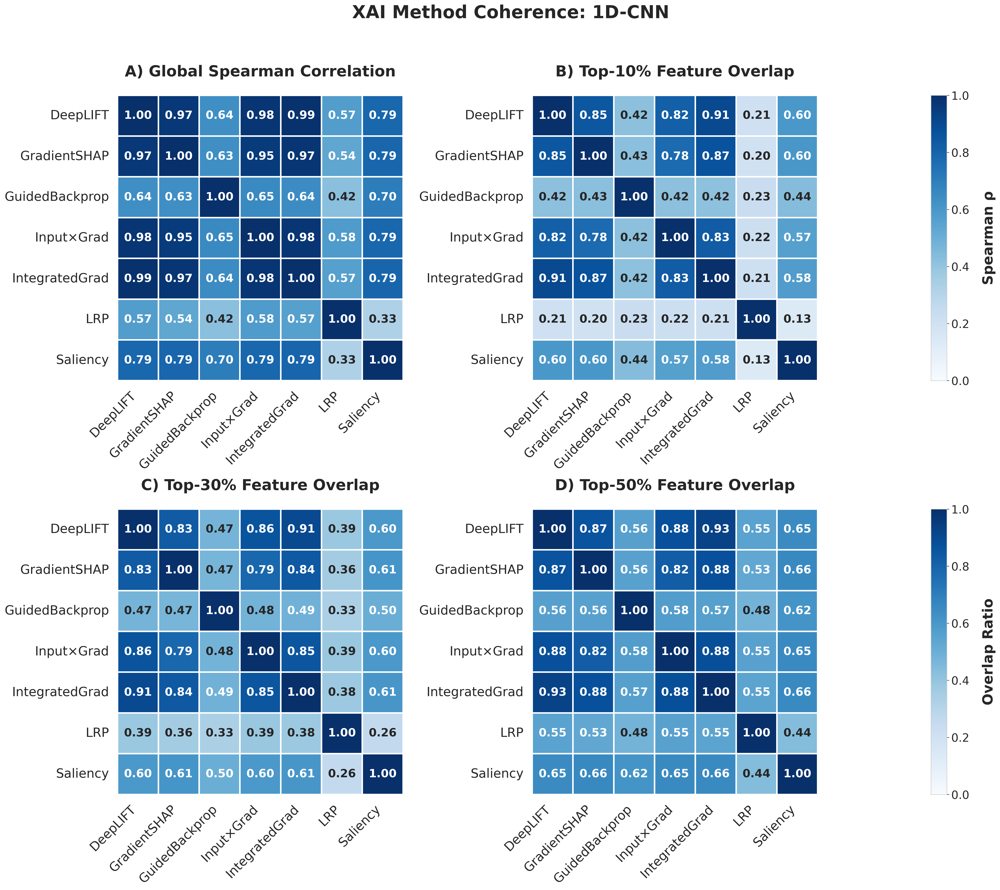

Performing drop-one-method ablation...


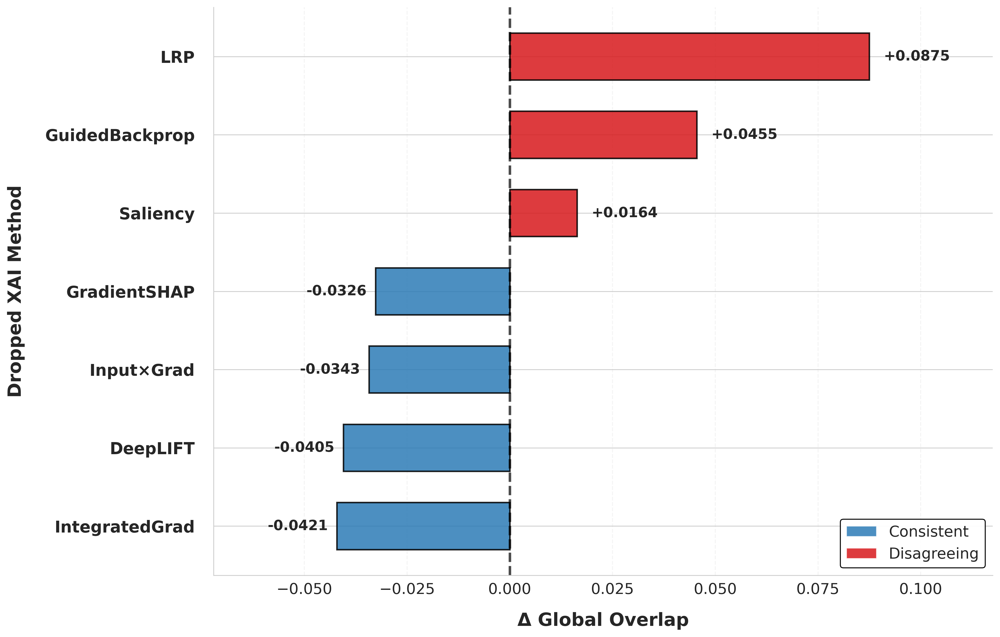


Ablation Results (Δ Global Overlap):
  LRP                 : Δ = +0.0875 (Disagreeing)
  GuidedBackprop      : Δ = +0.0455 (Disagreeing)
  Saliency            : Δ = +0.0164 (Disagreeing)
  GradientSHAP        : Δ = -0.0326 (Consistent)
  Input×Grad          : Δ = -0.0343 (Consistent)
  DeepLIFT            : Δ = -0.0405 (Consistent)
  IntegratedGrad      : Δ = -0.0421 (Consistent)


In [7]:
!pip -q install --no-deps captum zennit
!pip -q install scipy tqdm seaborn

from itertools import combinations
from scipy.stats import spearmanr
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch

from captum.attr import (
    Saliency,
    InputXGradient,
    IntegratedGradients,
    GuidedBackprop,
    DeepLift,
    GradientShap,
)

from zennit.composites import EpsilonPlus

# Set publication-quality plot parameters
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
plt.rcParams['font.size'] = 14
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['legend.fontsize'] = 14
plt.rcParams['figure.titlesize'] = 20
plt.rcParams['figure.titleweight'] = 'bold'

# ============================================================
# Pairwise Similarity Computation
# ============================================================

def compute_pairwise_similarity(attr_dict, ks=[10,20,30,40,50]):
    """
    Compute Spearman correlation and top-k spatial overlap between attribution maps.

    Parameters
    ----------
    attr_dict : dict
        Dictionary mapping method names to attribution arrays (C, T)
    ks : list
        Percentage thresholds for top-k overlap

    Returns
    -------
    list
        Similarity metrics for each method pair
    """
    methods = list(attr_dict.keys())
    n_feat = np.prod(list(attr_dict.values())[0].shape)
    flat_attr = {m: np.abs(attr_dict[m].flatten()) for m in methods}
    results = []

    for k in ks:
        k_n = min(int(n_feat * (k / 100)), n_feat)
        ranks = {m: np.argsort(flat_attr[m])[::-1][:k_n] for m in methods}
        bin_mask = {m: np.zeros(n_feat, dtype=int) for m in methods}
        for m in methods:
            bin_mask[m][ranks[m]] = 1

        for m1, m2 in combinations(methods, 2):
            rho, _ = spearmanr(flat_attr[m1], flat_attr[m2])
            inter = np.sum(bin_mask[m1] * bin_mask[m2])
            union = np.sum((bin_mask[m1] + bin_mask[m2]) > 0)
            w_overlap = inter / union if union > 0 else 0.0
            results.append({
                "Method1": m1, "Method2": m2,
                "k": k, "SpearmanRho": rho, "W_overlap": w_overlap
            })
    return results

# ============================================================
# Attribution Calculator
# ============================================================

class AttributionMethods:
    """
    Compute attributions for multiple XAI methods.

    Input shape: (1, C, T)
    Target: predicted class if None
    LRP: Zennit EpsilonPlus only, no fallback
    """
    def __init__(self, model, device=None, lrp_eps=1e-5):
        self.model = model
        self.model.eval()
        self.device = device if device is not None else next(model.parameters()).device

        # Captum methods
        self.sal = Saliency(self.model)
        self.ixg = InputXGradient(self.model)
        self.ig  = IntegratedGradients(self.model)
        self.gbp = GuidedBackprop(self.model)
        self.dl  = DeepLift(self.model)
        self.gs  = GradientShap(self.model)

        # Zennit composite for LRP
        self.lrp_eps = float(lrp_eps)
        self.composite = EpsilonPlus(epsilon=self.lrp_eps)

    @torch.no_grad()
    def _predict_target(self, x):
        logits = self.model(x.to(self.device))
        return int(torch.argmax(logits, dim=1).item())

    def _baseline_zeros(self, x):
        return torch.zeros_like(x)

    def _baseline_noise(self, x, n=16, stdev=0.02):
        _, c, t = x.shape
        return (torch.zeros((n, c, t), device=x.device) +
                stdev * torch.randn((n, c, t), device=x.device))

    def _lrp_epsplus(self, x, target):
        """Compute LRP attributions using Zennit EpsilonPlus."""
        self.model.eval()
        x = x.clone().detach().to(self.device).requires_grad_(True)

        with self.composite.context(self.model):
            out = self.model(x)
            score = out[0, target]
            relevance = torch.autograd.grad(score, x, retain_graph=False, create_graph=False)[0]

        return relevance.detach().cpu().numpy()

    def compute(self, x, target=None):
        """
        Compute attributions for all XAI methods.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor of shape (1, C, T)
        target : int, optional
            Target class. If None, uses predicted class.

        Returns
        -------
        dict
            Method name -> attribution array (1, C, T)
        """
        x = x.to(self.device)
        if target is None:
            target = self._predict_target(x)

        x = x.clone().detach().requires_grad_(True)
        base0 = self._baseline_zeros(x)

        out = {}
        out["Saliency"] = self.sal.attribute(x, target=target).detach().cpu().numpy()
        out["Input×Grad"] = self.ixg.attribute(x, target=target).detach().cpu().numpy()
        out["IntegratedGrad"] = self.ig.attribute(x, baselines=base0, target=target, n_steps=64).detach().cpu().numpy()
        out["GuidedBackprop"] = self.gbp.attribute(x, target=target).detach().cpu().numpy()
        out["DeepLIFT"] = self.dl.attribute(x, baselines=base0, target=target).detach().cpu().numpy()

        dist_base = self._baseline_noise(x, n=16, stdev=0.02)
        out["GradientSHAP"] = self.gs.attribute(
            x, baselines=dist_base, target=target, n_samples=16, stdevs=0.02
        ).detach().cpu().numpy()

        out["LRP"] = self._lrp_epsplus(x, target)

        return out

# ============================================================
# Coherence Analysis
# ============================================================

def coherence_analysis(models_per_fold, X, y, subjects, n_attr_samples=30, seed=42, lrp_eps=1e-5):

    rng = np.random.default_rng(seed)

    all_methods = [
        'Saliency','Input×Grad','IntegratedGrad',
        'GuidedBackprop','DeepLIFT','GradientSHAP',
        'LRP'
    ]

    results_all = []

    for fold, pack in models_per_fold.items():
        model = pack["model"].to(DEVICE).eval()
        train_subjects = np.array(pack["train_subjects"], dtype=object)
        test_subjects  = np.array(pack["test_subjects"], dtype=object)

        train_mask = np.isin(subjects, train_subjects)
        test_mask  = np.isin(subjects, test_subjects)

        X_train = X[train_mask]
        X_test  = X[test_mask]

        if len(X_test) == 0 or len(X_train) == 0:
            print(f"Fold {fold}: insufficient data, skipping.")
            continue

        # Standardise using training statistics only
        mean = X_train.mean(axis=(0,2), keepdims=True)
        std  = X_train.std(axis=(0,2), keepdims=True) + 1e-8
        X_test_std = (X_test - mean) / std

        # Select random subset of test samples
        idx = rng.choice(len(X_test_std), size=min(n_attr_samples, len(X_test_std)), replace=False)
        X_sample = X_test_std[idx]

        print(f"\nProcessing Fold {fold} | Samples: {len(X_sample)}")

        # Compute attributions
        attr_calc = AttributionMethods(model, device=DEVICE, lrp_eps=lrp_eps)
        attributions = {m: [] for m in all_methods}

        for i in tqdm(range(len(X_sample)), desc=f"Computing attributions (Fold {fold})"):
            x_i = torch.tensor(X_sample[i:i+1], dtype=torch.float32, device=DEVICE)
            attrs = attr_calc.compute(x_i, target=None)

            for m in all_methods:
                a = np.abs(attrs[m][0])  # Take absolute values for ranking
                attributions[m].append(a)

        # Average attributions across samples
        attributions_avg = {m: np.mean(np.stack(v), axis=0) for m, v in attributions.items()}

        # Compute pairwise similarities
        res = compute_pairwise_similarity(attributions_avg)
        for r in res:
            r.update({"Model": "1D-CNN", "Fold": fold})
        results_all.extend(res)

    return pd.DataFrame(results_all)

# ============================================================
# Visualisation Functions
# ============================================================

def create_model_average_matrices(df, k_values=[10, 30, 50]):
    """
    Create average similarity matrices across folds.
    """
    models = df['Model'].unique()
    results = {}

    for model in models:
        model_data = df[df['Model'] == model]
        methods = sorted(set(model_data["Method1"]).union(model_data["Method2"]))

        spearman_global = pd.DataFrame(np.eye(len(methods)), index=methods, columns=methods)
        overlap_k10 = pd.DataFrame(np.eye(len(methods)), index=methods, columns=methods)
        overlap_k30 = pd.DataFrame(np.eye(len(methods)), index=methods, columns=methods)
        overlap_k50 = pd.DataFrame(np.eye(len(methods)), index=methods, columns=methods)

        for m1, m2 in combinations(methods, 2):
            pair_data_all = model_data[((model_data['Method1'] == m1) & (model_data['Method2'] == m2)) |
                                       ((model_data['Method1'] == m2) & (model_data['Method2'] == m1))]

            if len(pair_data_all) > 0:
                spearman_global.loc[m1, m2] = spearman_global.loc[m2, m1] = pair_data_all['SpearmanRho'].mean()

                k10_data = pair_data_all[pair_data_all['k'] == 10]
                k30_data = pair_data_all[pair_data_all['k'] == 30]
                k50_data = pair_data_all[pair_data_all['k'] == 50]

                if len(k10_data) > 0:
                    overlap_k10.loc[m1, m2] = overlap_k10.loc[m2, m1] = k10_data['W_overlap'].mean()
                if len(k30_data) > 0:
                    overlap_k30.loc[m1, m2] = overlap_k30.loc[m2, m1] = k30_data['W_overlap'].mean()
                if len(k50_data) > 0:
                    overlap_k50.loc[m1, m2] = overlap_k50.loc[m2, m1] = k50_data['W_overlap'].mean()

        results[model] = (spearman_global, overlap_k10, overlap_k30, overlap_k50)

    return results

def plot_four_matrix_panel(model_matrices_dict):
    """
    Plot four heatmaps: Spearman correlation and top-k overlap at 10%, 30%, 50%.
    """
    blue_cmap = "Blues"

    for model_name, (spearman_global, overlap_k10, overlap_k30, overlap_k50) in model_matrices_dict.items():
        fig = plt.figure(figsize=(24, 20))

        gs = fig.add_gridspec(2, 3, width_ratios=[1, 1, 0.05], height_ratios=[1, 1],
                              hspace=0.45, wspace=0.45)

        fig.suptitle(f'XAI Method Coherence: {model_name}',
                    fontsize=28, fontweight='bold', y=0.98)

        # Spearman Correlation
        ax1 = fig.add_subplot(gs[0, 0])
        spearman_pos = spearman_global.copy()
        np.fill_diagonal(spearman_pos.values, 1.0)

        im1 = sns.heatmap(spearman_pos, annot=True, fmt=".2f", cmap=blue_cmap,
                         vmin=0, vmax=1, ax=ax1, cbar=False, square=True,
                         annot_kws={"size": 18, "weight": "bold"},
                         linewidths=2, linecolor='white')
        ax1.set_title('A) Global Spearman Correlation', fontsize=24, fontweight='bold', pad=30)
        ax1.set_xlabel('')
        ax1.set_ylabel('')
        ax1.tick_params(axis='x', rotation=45, labelsize=20, pad=10)
        ax1.tick_params(axis='y', rotation=0, labelsize=20, pad=10)
        for label in ax1.get_xticklabels():
            label.set_ha('right')

        # Colorbar for Spearman
        cbar_ax1 = fig.add_subplot(gs[0, 2])
        cbar1 = plt.colorbar(im1.get_children()[0], cax=cbar_ax1)
        cbar1.set_label('Spearman ρ', fontsize=22, fontweight='bold', labelpad=20)
        cbar1.ax.tick_params(labelsize=18)

        # Top-10% Overlap
        ax2 = fig.add_subplot(gs[0, 1])
        im2 = sns.heatmap(overlap_k10, annot=True, fmt=".2f", cmap=blue_cmap,
                         vmin=0, vmax=1, ax=ax2, cbar=False, square=True,
                         annot_kws={"size": 18, "weight": "bold"},
                         linewidths=2, linecolor='white')
        ax2.set_title('B) Top-10% Feature Overlap', fontsize=24, fontweight='bold', pad=30)
        ax2.set_xlabel('')
        ax2.set_ylabel('')
        ax2.tick_params(axis='x', rotation=45, labelsize=20, pad=10)
        ax2.tick_params(axis='y', rotation=0, labelsize=20, pad=10)
        for label in ax2.get_xticklabels():
            label.set_ha('right')

        # Top-30% Overlap
        ax3 = fig.add_subplot(gs[1, 0])
        im3 = sns.heatmap(overlap_k30, annot=True, fmt=".2f", cmap=blue_cmap,
                         vmin=0, vmax=1, ax=ax3, cbar=False, square=True,
                         annot_kws={"size": 18, "weight": "bold"},
                         linewidths=2, linecolor='white')
        ax3.set_title('C) Top-30% Feature Overlap', fontsize=24, fontweight='bold', pad=30)
        ax3.set_xlabel('')
        ax3.set_ylabel('')
        ax3.tick_params(axis='x', rotation=45, labelsize=20, pad=10)
        ax3.tick_params(axis='y', rotation=0, labelsize=20, pad=10)
        for label in ax3.get_xticklabels():
            label.set_ha('right')

        # Top-50% Overlap
        ax4 = fig.add_subplot(gs[1, 1])
        im4 = sns.heatmap(overlap_k50, annot=True, fmt=".2f", cmap=blue_cmap,
                         vmin=0, vmax=1, ax=ax4, cbar=False, square=True,
                         annot_kws={"size": 18, "weight": "bold"},
                         linewidths=2, linecolor='white')
        ax4.set_title('D) Top-50% Feature Overlap', fontsize=24, fontweight='bold', pad=30)
        ax4.set_xlabel('')
        ax4.set_ylabel('')
        ax4.tick_params(axis='x', rotation=45, labelsize=20, pad=10)
        ax4.tick_params(axis='y', rotation=0, labelsize=20, pad=10)
        for label in ax4.get_xticklabels():
            label.set_ha('right')

        # Shared colorbar for overlap plots
        cbar_ax2 = fig.add_subplot(gs[1, 2])
        cbar2 = plt.colorbar(im4.get_children()[0], cax=cbar_ax2)
        cbar2.set_label('Overlap Ratio', fontsize=22, fontweight='bold', labelpad=20)
        cbar2.ax.tick_params(labelsize=18)

        plt.tight_layout()
        plt.show()

# ============================================================
# Drop-One-Method Ablation
# ============================================================

def ablation_test(df):
    """
    Evaluate how removing each XAI method affects global agreement.

    Negative Δ: removal reduces agreement (method is consistent)
    Positive Δ: removal increases agreement (method is disagreeing)
    """
    results = []
    for model, model_data in df.groupby("Model"):
        base_mean = model_data["W_overlap"].mean()
        methods = sorted(set(model_data["Method1"]).union(model_data["Method2"]))

        for method_to_drop in methods:
            filtered_data = model_data[~model_data["Method1"].eq(method_to_drop) &
                                     ~model_data["Method2"].eq(method_to_drop)]

            if len(filtered_data) > 0:
                new_mean = filtered_data["W_overlap"].mean()
                delta = new_mean - base_mean

                results.append({
                    "Model": model,
                    "Dropped": method_to_drop,
                    "Δ_GlobalOverlap": delta,
                    "Baseline": base_mean,
                    "New": new_mean,
                    "Interpretation": "Consistent" if delta < 0 else "Disagreeing" if delta > 0 else "Neutral"
                })

    return pd.DataFrame(results)

def plot_ablation(df_ablate, figsize=(14, 9)):
    """
    Plot ablation results as horizontal bar chart.
    """
    for model, d in df_ablate.groupby("Model"):
        fig, ax = plt.subplots(figsize=figsize, dpi=300)

        d_sorted = d.sort_values("Δ_GlobalOverlap", ascending=True)
        colors = ['#2c7bb6' if x < 0 else '#d7191c' for x in d_sorted["Δ_GlobalOverlap"]]

        y_pos = np.arange(len(d_sorted))
        bars = ax.barh(y_pos, d_sorted["Δ_GlobalOverlap"],
                       color=colors, alpha=0.85, edgecolor='black', linewidth=1.5,
                       height=0.6)

        x_min = min(d_sorted["Δ_GlobalOverlap"].min() - 0.03, -0.01)
        x_max = max(d_sorted["Δ_GlobalOverlap"].max() + 0.03, 0.01)
        ax.set_xlim(x_min, x_max)

        ax.axvline(x=0, color='black', linestyle='--', alpha=0.7, linewidth=2.5)

        for i, (v, bar) in enumerate(zip(d_sorted["Δ_GlobalOverlap"], bars)):
            if v >= 0:
                ax.text(v + (x_max * 0.03), i, f'+{v:.4f}',
                       va='center', ha='left', fontsize=14, fontweight='bold')
            else:
                ax.text(v - (abs(x_min) * 0.03), i, f'{v:.4f}',
                       va='center', ha='right', fontsize=14, fontweight='bold')

        ax.set_yticks(y_pos)
        ax.set_yticklabels(d_sorted["Dropped"], fontsize=16, fontweight='bold')
        ax.tick_params(axis='y', pad=15)
        ax.tick_params(axis='x', labelsize=15)

        ax.set_xlabel("Δ Global Overlap", fontsize=18, fontweight='bold', labelpad=15)
        ax.set_ylabel("Dropped XAI Method", fontsize=18, fontweight='bold', labelpad=20)

        from matplotlib.patches import Patch
        legend_elements = [
            Patch(facecolor='#2c7bb6', alpha=0.85, label='Consistent'),
            Patch(facecolor='#d7191c', alpha=0.85, label='Disagreeing')
        ]
        ax.legend(handles=legend_elements, loc='lower right',
                 fontsize=15, framealpha=0.95, edgecolor='black')

        ax.grid(axis='x', alpha=0.2, linestyle='--', linewidth=1)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        plt.tight_layout()
        plt.show()

# ============================================================
# Execute Analysis
# ============================================================

print("Running coherence analysis...")
coherence_df = coherence_analysis(models_per_fold, X, y, subjects, n_attr_samples=30, seed=42, lrp_eps=1e-5)

if not coherence_df.empty:
    print("Generating coherence matrices...")
    sns.set_style("whitegrid")
    sns.set_palette("husl")

    model_matrices = create_model_average_matrices(coherence_df)
    plot_four_matrix_panel(model_matrices)

    print("Performing drop-one-method ablation...")
    ablation_df = ablation_test(coherence_df)
    plot_ablation(ablation_df, figsize=(14, 9))

    # Print summary
    print("\nAblation Results (Δ Global Overlap):")
    ablation_summary = ablation_df.sort_values('Δ_GlobalOverlap', ascending=False)
    for _, row in ablation_summary.iterrows():
        print(f"  {row['Dropped']:20s}: Δ = {row['Δ_GlobalOverlap']:+.4f} ({row['Interpretation']})")

else:
    print("Coherence analysis failed - no results generated.")

#### **Final Step: Mean Heatmap Visualisation**

This cell generates average relevance maps across test samples and folds to visualise the spatial distribution of feature importance for each XAI method.

**What this cell does:**
- **Individual heatmaps**: Displays all seven XAI methods in a 4×2 grid, with channels (joint angles) on the Y-axis and percentage gait cycle on the X-axis, enabling visual comparison of attribution patterns across methods.
- **Combined heatmap**: Averages across selected methods (DeepLIFT, GradientSHAP, Input×Gradient, Integrated Gradients, Saliency) to produce a single consensus map for qualitative comparison with traditional clinical evaluation.

**Key output:**
- Normalised attribution maps (0-1 scale per method)
- 8 channels × 101 timepoints per heatmap
- % gait cycle ticks at 20% intervals (individual) or 10% intervals (combined)

**Expected result:**
Methods that passed sensitivity and faithfulness checks should show concentrated relevance in sagittal ankle kinematics, aligning with known biomechanical signatures of ITW and SPM effect sizes (Figure 8 in the paper). Methods exhibiting diffuse or physiologically implausible patterns may reflect artefactual attributions.


Processing model: 1D-CNN


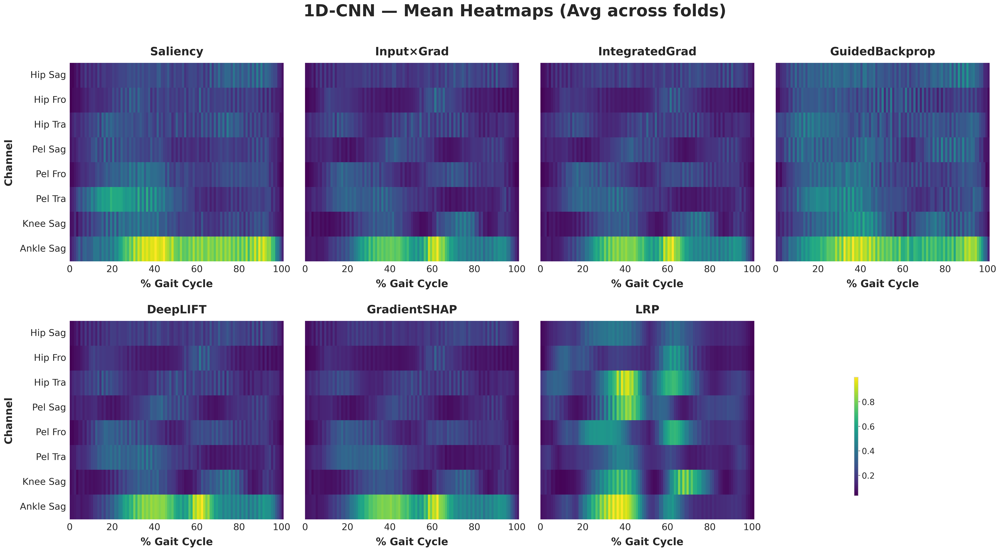

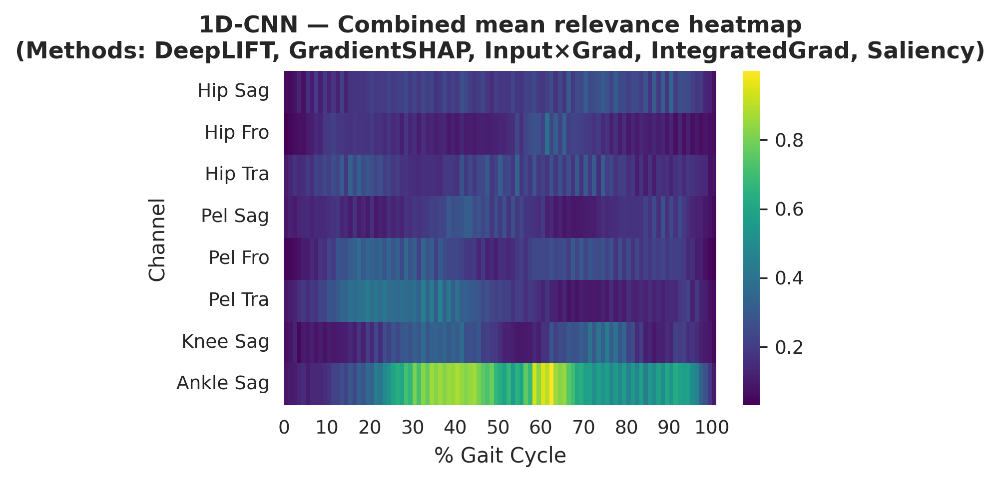

In [8]:
!pip -q install --no-deps captum zennit
!pip -q install tqdm seaborn

import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

from captum.attr import (
    Saliency,
    InputXGradient,
    IntegratedGradients,
    GuidedBackprop,
    DeepLift,
    GradientShap,
)

from zennit.composites import EpsilonPlus

# Set publication-quality plot parameters
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
plt.rcParams['font.size'] = 16
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16

# ============================================================
# Attribution Calculator
# ============================================================

class AttributionMethods:
    """
    Compute attributions for multiple XAI methods.

    Input shape: (1, C, T)
    Target: predicted class if None
    LRP: Zennit EpsilonPlus only, no fallback
    """
    def __init__(self, model, device=None, lrp_eps=1e-5):
        self.model = model.eval()
        self.device = device if device is not None else next(model.parameters()).device

        # Captum methods
        self.sal = Saliency(self.model)
        self.ixg = InputXGradient(self.model)
        self.ig  = IntegratedGradients(self.model)
        self.gbp = GuidedBackprop(self.model)
        self.dl  = DeepLift(self.model)
        self.gs  = GradientShap(self.model)

        # Zennit composite for LRP
        self.composite = EpsilonPlus(epsilon=float(lrp_eps))

    @torch.no_grad()
    def _predict_target(self, x):
        logits = self.model(x.to(self.device))
        return int(torch.argmax(logits, dim=1).item())

    def _baseline_zeros(self, x):
        return torch.zeros_like(x)

    def _baseline_noise(self, x, n=16, stdev=0.02):
        _, c, t = x.shape
        return torch.zeros((n, c, t), device=x.device) + stdev * torch.randn((n, c, t), device=x.device)

    def _lrp_epsplus(self, x, target):
        x = x.clone().detach().to(self.device).requires_grad_(True)
        with self.composite.context(self.model):
            out = self.model(x)
            score = out[0, target]
            rel = torch.autograd.grad(score, x)[0]
        return rel.detach().cpu().numpy()

    def compute(self, x, target=None):
        """
        Compute attributions for all XAI methods.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor of shape (1, C, T)
        target : int, optional
            Target class. If None, uses predicted class.

        Returns
        -------
        dict
            Method name -> attribution array (1, C, T)
        """
        x = x.to(self.device)
        if target is None:
            target = self._predict_target(x)

        x = x.clone().detach().requires_grad_(True)
        base0 = self._baseline_zeros(x)

        out = {
            "Saliency": self.sal.attribute(x, target=target).detach().cpu().numpy(),
            "Input×Grad": self.ixg.attribute(x, target=target).detach().cpu().numpy(),
            "IntegratedGrad": self.ig.attribute(x, baselines=base0, target=target, n_steps=64).detach().cpu().numpy(),
            "GuidedBackprop": self.gbp.attribute(x, target=target).detach().cpu().numpy(),
            "DeepLIFT": self.dl.attribute(x, baselines=base0, target=target).detach().cpu().numpy(),
            "GradientSHAP": self.gs.attribute(
                x,
                baselines=self._baseline_noise(x),
                target=target,
                n_samples=16,
                stdevs=0.02
            ).detach().cpu().numpy(),
            "LRP": self._lrp_epsplus(x, target)
        }
        return out

# ============================================================
# Mean Relevance Map Computation
# ============================================================

def compute_mean_relevance_maps(model, X_sample, device):
    """
    Compute average attribution maps across multiple samples.

    Parameters
    ----------
    model : torch.nn.Module
        Trained model
    X_sample : np.ndarray
        Sample inputs of shape (N, C, T)
    device : torch.device
        Computation device

    Returns
    -------
    dict
        Method name -> mean attribution map (C, T)
    """
    model = model.to(device).eval()
    attr_calc = AttributionMethods(model, device=device)

    methods = [
        'Saliency','Input×Grad','IntegratedGrad',
        'GuidedBackprop','DeepLIFT','GradientSHAP','LRP'
    ]
    store = {m: [] for m in methods}

    for i in tqdm(range(len(X_sample)), desc="Computing attributions", leave=False):
        x = torch.tensor(X_sample[i:i+1], dtype=torch.float32, device=device)
        attrs = attr_calc.compute(x, target=None)
        for m in methods:
            store[m].append(np.abs(attrs[m][0]))

    return {m: np.mean(np.stack(v), axis=0) for m, v in store.items()}

# ============================================================
# Cross-Fold Aggregation
# ============================================================

R_MEAN_ALL = {"1D-CNN": {}}

print("\nProcessing model: 1D-CNN")

for fold, pack in models_per_fold.items():
    model = pack["model"]
    train_subs = np.array(pack["train_subjects"], dtype=object)
    test_subs  = np.array(pack["test_subjects"], dtype=object)

    train_mask = np.isin(subjects, train_subs)
    test_mask  = np.isin(subjects, test_subs)

    X_train = X[train_mask]
    X_test  = X[test_mask]

    if len(X_test) == 0:
        continue

    # Standardise using training statistics only
    mean = X_train.mean(axis=(0,2), keepdims=True)
    std  = X_train.std(axis=(0,2), keepdims=True) + 1e-8
    X_test_std = (X_test - mean) / std

    # Select random test samples
    idx = np.random.choice(len(X_test_std), min(20, len(X_test_std)), replace=False)
    X_sample = X_test_std[idx]

    R_MEAN_ALL["1D-CNN"][fold] = compute_mean_relevance_maps(model, X_sample, DEVICE)

# ============================================================
# Visualisation
# ============================================================

channel_labels = [
    "Hip Sag", "Hip Fro", "Hip Tra",
    "Pel Sag", "Pel Fro", "Pel Tra",
    "Knee Sag", "Ankle Sag"
]

def plot_mean_relevance_grid(R_MEAN_avg, title):
    """
    Plot heatmaps for all XAI methods in a 4x2 grid.

    Layout:
    - Top row: 4 heatmaps
    - Bottom row: 3 heatmaps + thin colorbar
    - Y-axis labels only on leftmost plots
    - X-axis labels on all plots
    """
    methods = list(R_MEAN_avg.keys())

    # Create figure with wider aspect ratio
    fig = plt.figure(figsize=(32, 16))

    # Grid layout: 2 rows, 4 columns with minimal spacing
    gs = fig.add_gridspec(2, 4, width_ratios=[1, 1, 1, 1], height_ratios=[1, 1],
                          hspace=0.3, wspace=0.1)

    fig.suptitle(title, fontsize=32, fontweight='bold', y=0.98)

    n_time = next(iter(R_MEAN_avg.values())).shape[1]
    xticks = np.linspace(0, n_time - 1, 6)
    xticklabels = [str(i) for i in range(0, 101, 20)]

    # Grid positions for each method
    positions = [
        (0, 0), (0, 1), (0, 2), (0, 3),  # Top row
        (1, 0), (1, 1), (1, 2)           # Bottom row
    ]

    last_im = None

    # Generate heatmaps
    for idx, method in enumerate(methods):
        row, col = positions[idx]
        ax = fig.add_subplot(gs[row, col])

        M = R_MEAN_avg[method]
        M = M / (M.max() + 1e-8)  # Normalize to [0, 1]

        # Show y-axis labels only on leftmost plots
        show_yticks = (col == 0)

        im = sns.heatmap(
            M,
            cmap="viridis",
            ax=ax,
            yticklabels=channel_labels if show_yticks else False,
            xticklabels=False,
            cbar=False,
            square=False,
            rasterized=True
        )
        last_im = im

        ax.set_title(method, fontsize=22, fontweight='bold', pad=15)
        ax.set_xlabel("% Gait Cycle", fontsize=20, fontweight='bold', labelpad=10)
        ax.set_xticks(xticks)
        ax.set_xticklabels(xticklabels, fontsize=18)

        if show_yticks:
            ax.set_ylabel("Channel", fontsize=20, fontweight='bold', labelpad=12)

        ax.tick_params(axis='y', labelsize=18 if show_yticks else 0)
        ax.tick_params(axis='x', labelsize=18)

        if not show_yticks:
            ax.tick_params(axis='y', length=0)

    # Add thin colorbar at bottom right corner
    cbar_ax = fig.add_subplot(gs[1, 3])
    cbar_ax.set_position([0.78, 0.15, 0.015, 0.2])  # x, y, width, height

    cbar = fig.colorbar(last_im.get_children()[0], cax=cbar_ax)
    cbar.ax.tick_params(labelsize=16)
    cbar.set_label('')
    cbar_ax.set_aspect(30)

    plt.show()

# ============================================================
# Average Across Folds and Plot
# ============================================================

# Aggregate results across folds
folds_data = R_MEAN_ALL["1D-CNN"]
methods = list(next(iter(folds_data.values())).keys())

R_MEAN_avg = {
    m: np.mean([folds_data[f][m] for f in folds_data], axis=0)
    for m in methods
}

# Generate visualisation
plot_mean_relevance_grid(
    R_MEAN_avg,
    title="1D-CNN — Mean Heatmaps (Avg across folds)"
)


# ============================================================
# COMBINED MEAN RELEVANCE HEATMAP
# ============================================================
# Aggregates and visualizes mean relevance maps across selected XAI methods.
# Uses pre-computed fold-averaged attributions from R_MEAN_ALL.
#
# Selected methods (as per paper):
# - DeepLIFT
# - GradientSHAP
# - Input × Gradient
# - Integrated Gradients
# - Saliency Maps
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Configuration
SELECTED_METHODS = ['DeepLIFT', 'GradientSHAP', 'Input×Grad', 'IntegratedGrad', 'Saliency']
FIGURE_SIZE = (5, 3.5)  # Width, height in inches

# ============================================================
# Visualisation Function
# ============================================================

def plot_combined_mean_heatmap(R_MEAN_avg, model_name, include_methods, channel_labels, figsize=FIGURE_SIZE):

    # Filter to available methods
    selected = [m for m in include_methods if m in R_MEAN_avg]
    if len(selected) == 0:
        print(f"{model_name}: none of {include_methods} found. Available: {list(R_MEAN_avg.keys())}")
        return

    # Average across selected methods
    selected_maps = [R_MEAN_avg[m] for m in selected]
    combined = np.mean(np.stack(selected_maps, axis=0), axis=0)
    combined = combined / (combined.max() + 1e-8)  # Normalize to [0, 1]

    # Set up x-axis ticks (0-100% gait cycle in 10% steps)
    n_time = combined.shape[1]
    xticks = np.linspace(0, n_time - 1, 11)
    xticklabels = [str(i) for i in range(0, 101, 10)]

    # Create heatmap
    plt.figure(figsize=figsize)
    ax = sns.heatmap(
        combined,
        cmap="viridis",
        yticklabels=channel_labels,
        xticklabels=False,
        cbar=True
    )

    # Formatting
    ax.set_title(
        f"{model_name} — Combined mean relevance heatmap\n(Methods: {', '.join(selected)})",
        fontsize=11,
        fontweight='bold'
    )
    ax.set_xlabel("% Gait Cycle", fontsize=10)
    ax.set_ylabel("Channel", fontsize=10)

    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)

    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=9)

    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels, fontsize=9)

    plt.tight_layout()
    plt.show()

# ============================================================
# Aggregate Across Folds and Generate Plots
# ============================================================

for model_name, folds_data in R_MEAN_ALL.items():
    if len(folds_data) == 0:
        print(f"{model_name}: no fold data found.")
        continue

    # Collect all methods present across folds
    all_methods = sorted({m for f in folds_data for m in folds_data[f].keys()})
    R_MEAN_avg = {}

    # Average each method across folds
    for m in all_methods:
        maps = [folds_data[f][m] for f in folds_data if m in folds_data[f]]
        if len(maps) == 0:
            continue
        R_MEAN_avg[m] = np.mean(np.stack(maps, axis=0), axis=0)

    # Generate combined heatmap for selected methods
    plot_combined_mean_heatmap(
        R_MEAN_avg,
        model_name,
        SELECTED_METHODS,
        channel_labels,
        figsize=FIGURE_SIZE
    )